In [2]:
import os, sys, glob
import re
from datetime import datetime, timedelta,date
import pandas as pd
from IPython.display import display
import xarray as xr
from matplotlib import dates as mdates

from scipy import stats
from scipy.stats import multivariate_normal
import seaborn as sns

import learning_lidar.generation.generate_density_utils as gen_den_utils
import learning_lidar.generation.generation_utils as gen_utils
import learning_lidar.preprocessing.preprocessing_utils as prep_utils
from learning_lidar.generation.KDE_estimation_sample import kde_estimation_main
from learning_lidar.generation.generate_LC_pattern import generate_LC_pattern_main
import learning_lidar.generation.generate_bg_signals_utils as gen_bg_utils
from learning_lidar.utils import utils, xr_utils, vis_utils, proc_utils, global_settings as gs
vis_utils.set_visualization_settings()
TIMEFORMAT = mdates.DateFormatter(r'%H')
import numpy as np
import matplotlib.pyplot as plt
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from pytictoc import TicToc
from kneed import KneeLocator
import sklearn
from sklearn.cluster import KMeans
from sklearn.neighbors import KernelDensity
from mpl_toolkits.axes_grid1 import make_axes_locatable
import random
import learning_lidar.dataseting.dataseting_utils as ds_utils
# Define simple gaussian
def gauss_function(x, amp, x0, sigma):
    return amp * np.exp(-(x - x0) ** 2. / (2. * sigma ** 2.))

# Empirical validating of ALiDAn's aerosol model - first version using KDE
This Notebook was created as a validation to the 2D Gaussian model suggested in ALiDAn.
The results of this notebook are published in APPENDIX A of the main paper
The validation is done by choosing a clear sky day measurement
For this day we took PollyNet Processing Chain retrievals of the backscatter, i.e., $\beta^{\rm aer}$
Then we demonstrate that a 2D Gaussian model can represent aerosol spatiotemporal density
The representation is done using scipy [Kernel Density Estimation model](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KernelDensity.html)

In [3]:
def :plot_daily_profile_for_publish(profile_ds, height_slice=None, figsize=(15, 5),
                                save_fig=False, threshold=None, cbar_text=None,
                                folder_name:os.path = None, format_fig:str='png'):
    wavelengths = profile_ds.Wavelength.values
    if height_slice is None:
        height_slice = slice(profile_ds.Height[0].values, profile_ds.Height[-1].values)
    str_date = profile_ds.Time[0].dt.strftime("%Y-%m-%d").values.tolist()
    ncols = wavelengths.size
    fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=figsize, sharey=True)
    if ncols > 1:
        for col_index, (wavelength, ax) in enumerate(zip(wavelengths, axes.ravel())):
            ds = profile_ds.sel(Height=height_slice, Wavelength=wavelength)
            # try:
            #     ds.attrs['units'] = ds.attrs['units'].replace("km", r"\textbf{km}")
            # except Exception as e:
            #     print(e)
            ds.Height.attrs['units'] = ds.Height.attrs['units'].replace("km", r"\textbf{km}")

            if threshold is None:
                threshold = ds.max()
                if not (isinstance(threshold, int) or isinstance(threshold, float) ):
                    threshold = threshold.values
                    #print(threshold)
            ds = xr.DataArray.clip(ds, max=threshold, keep_attrs=True)
            # ds = ds.where(ds<threshold)
            if col_index == 0:
                cbar_ax = fig.add_axes([.91, .15, .03, .7])

            ds.plot(cmap='turbo', ax=ax, vmin=0, vmax=threshold, cbar_ax=cbar_ax,zorder=-20)
            ax.set_rasterization_zorder(-10)
            ax.xaxis.set_major_formatter(TIMEFORMAT)
            ax.xaxis.set_tick_params(rotation=0)
            ax.set_title("")
            ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
            ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
            for tick in ax.xaxis.get_majorticklabels():
                tick.set_horizontalalignment("left")
            if col_index != 0:
                ax.yaxis.label.set_visible(False)
    else:
        ax = axes
        ds = profile_ds.sel(Height=height_slice)
        # try:
        #     ds.attrs['units'] = ds.attrs['units'].replace("km", r"\textbf{km}")
        # except Exception as e:
        #     print(e)
        ds.Height.attrs['units'] = ds.Height.attrs['units'].replace("km", r"\textbf{km}")
        cbar_ax = fig.add_axes([.91, .15, .03, .7])
        if threshold is None:
            threshold = ds.max()
            if not (isinstance(threshold, int) or isinstance(threshold, float) ):
                threshold = threshold.values
                #print(threshold)
                ds = xr.DataArray.clip(ds, max=threshold, keep_attrs=True)

        ds.plot(cmap='turbo', ax=ax,vmin=0, vmax=threshold, cbar_ax=cbar_ax, zorder=-20)
        ax.set_rasterization_zorder(-10)
        ax.xaxis.set_major_formatter(TIMEFORMAT)
        ax.xaxis.set_tick_params(rotation=0)
        ax.set_title("")
        ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
        ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
        for tick in ax.xaxis.get_majorticklabels():
            tick.set_horizontalalignment("left")

    if cbar_text:
        cbar_ax.set_ylabel(cbar_text)

    plt.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    if ncols > 1:
        fig.tight_layout(rect=[0, 0, .9, 1])
    else:
        fig.tight_layout(rect=[0, 0, .87, 1])
    if save_fig:
        if folder_name is None:
             folder_name = os.path.join(os.path.abspath(os.path.curdir),'figures')
        suptitle = f"{profile_ds.info} - {str_date}"
        fig_path = vis_utils.save_fig(fig, fig_name=suptitle,
                                   folder_name=folder_name,
                                   format_fig=format_fig)
    else:
        fig_path=None
    plt.show()
    return fig_path, fig, axes

In [4]:
def daily_backscatter_from_profiles(day_date:datetime, station:gs.Station, wavelength:int=532, df_calib:pd.DataFrame=None):

    # set daily_datset_df.
    # If df_calib is None, then generate a dataframe from TROPOS data at level1a
    if df_calib is None:
        profiles_paths = prep_utils.get_TROPOS_dataset_paths(station, day_date, file_type= 'profiles',level = 'level1a')
        profiles_paths.sort()
        format_filename = r"(.*)_(.*)_TROPOS_(.*)_(.*)_(.*)_profiles.nc"
        format_times= ["%Y_%m_%d","%a", "%H_%M_%S", "%H%M", "%H%M"]
        time_stamps = [prep_utils.extract_date_time(path,format_filename, format_times) for path in profiles_paths]
        timestamps_df = pd.DataFrame(time_stamps,profiles_paths, columns=['dt_day', 'day','raw_time','start_time','end_time' ])
        daily_datset_df = timestamps_df.apply(lambda row: [row['dt_day'].date(),
                                       datetime.combine(date = row['dt_day'].date(),time=row['raw_time'].time()),
                                       datetime.combine(date = row['dt_day'].date(),time=row['start_time'].time()),
                                       datetime.combine(date = row['dt_day'].date(),time=row['end_time'].time())] ,
                          axis=1, result_type='expand').set_axis(['date','raw_time', 'start_time_period', 'end_time_period'], axis=1).\
            reset_index().rename(columns={'index':'profile_path'}).sort_values(by='start_time_period',ascending=True,ignore_index=True)
    else:
        daily_datset_df =  df_calib.loc[(df_calib['wavelength']==wavelength) & (pd.to_datetime(df_calib['date'])==day_date)].\
            sort_values(by='start_time_period',ascending=True,ignore_index=True)

    def _calc_mid_time(row):
        # Set time of profile to the center of the time slice
        dt_start = datetime.strptime(str(row['start_time_period']),'%Y-%m-%d %H:%M:%S')
        dt_end = datetime.strptime(str(row['end_time_period']),'%Y-%m-%d %H:%M:%S')
        dt_mid = dt_start+0.5*(dt_end-dt_start)
        round_seconds = timedelta(seconds=dt_mid.second % 30) # round according to time resolution of TROPOS
        dt_mid +=round_seconds
        return  dt_mid


    daily_datset_df ['mid_time_period'] =daily_datset_df.apply(lambda row:_calc_mid_time(row),axis=1, result_type='expand')
    #display(daily_datset_df)

    ## % initialize dataset of daily_beta_chan (xr.DataSet)
    heightIndx = station.get_height_bins_values()
    timeIndx = station.calc_daily_time_index(day_date)
    height_units = 'km'

    daily_beta_chan = xr.Dataset(data_vars={'beta': (('Height', 'Time','Wavelength'),
                                                     np.empty((heightIndx.shape[0], timeIndx.shape[0],1)))},
                                coords={'Height':heightIndx,'Time':timeIndx,'Wavelength': [wavelength]})
    daily_beta_chan.beta.attrs = {'long_name': r'$\beta $',
                                  'units': r'$\rm \frac{1}{km \cdot sr}$',
                                  'info': "Daily estimated aerosol backscatter by PollyNet Processing Chain, Tropos",
                                  'source_data': 'level1a',
                                  }
    daily_beta_chan.attrs = {'location':station.location}

    ## set attributes of coordinates
    daily_beta_chan.Height.attrs = {'units': fr'$\rm {height_units}$',
                                    'info': 'Measurements heights above sea level'}
    daily_beta_chan.Wavelength.attrs = {'long_name': r'$\lambda$', 'units': r'$\rm nm$'}
    daily_beta_chan = daily_beta_chan.transpose('Wavelength', 'Height', 'Time')
    daily_beta_chan['date'] = day_date

    ## Loading beta profiles and save into  daily_beta_chan
    Pollynet_key = f'aerBsc_klett_{wavelength}'
    valids = []
    print(f"Loading data from {day_date.strftime('%Y-%m-%d')} at {wavelength}...")
    for profile_name,dt_mid in zip(daily_datset_df.profile_path,daily_datset_df.mid_time_period):
        # Load profile
        pollynet_da = xr_utils.load_dataset(profile_name)
        profile = pollynet_da[Pollynet_key].values
        if np.isnan(profile).all():
            valids.append(False)
            continue

        #print([profile is None])
        valids.append(True)
        daily_beta_chan.beta.loc[dict(Time = dt_mid)]=profile

    # Filter valid times
    daily_datset_df['valid'] = valids

    print(f"Done loading data.")

    # Convert from 1/(mr sr) to 1/(km sr)
    daily_beta_chan = prep_utils.convert_profiles_units(daily_beta_chan)
    return daily_beta_chan, daily_datset_df

In [ ]:
station_name='haifa'
SAVE_FIG = True
station = gs.Station(station_name)
day_date = datetime(2017,10,2)
month_folder = utils.get_month_folder_name(station.lidar_dataset, day_date)
file_name = xr_utils.get_prep_dataset_file_name(station, day_date, data_source='lidar', file_type='all')
raw_daily_path = glob.glob(os.path.join(month_folder, file_name))[0]
raw_daily_path  #raw_daily = xr_utils.load_dataset(raw_daily_path)
#raw_daitype(raw_daily_path)
raw_daily_ds = xr_utils.load_dataset(raw_daily_path)
plot_daily_profile_for_Opex(raw_daily_ds.range_corr.sel(Wavelength=532), height_slice=height_slice, figsize=(12, 5),
                            save_fig=SAVE_FIG, threshold=300)

# Search for date and wavelength with max repetition for each month

In [4]:
# station_name = 'haifa'
# station = gs.Station(station_name)
# dates = [(datetime(2017,4,1),datetime(2017,4,30)),
#          (datetime(2017,5,1),datetime(2017,5,31)),
#          (datetime(2017,9,1),datetime(2017,9,30)),
#          (datetime(2017,10,1),datetime(2017,10,31))]
#
# rows=[]
# for ind,(dts) in enumerate(dates):
#     start_dt, end_dt = dts
#     fname = rf"dataset_{station_name}_{start_dt.strftime('%Y-%m-%d')}_{end_dt.strftime('%Y-%m-%d')}.csv"
#     full_path = os.path.join(gs.PKG_DATA_DIR,fname)
#     if not os.path.exists(full_path):
#         continue
#     dataset_df = pd.read_csv(full_path)
#     dataset_df['wavelength'] = dataset_df['wavelength'].astype(int)
#     # search for date and wavelength with max repetition for each .csv dataset file
#     max_repetition = dataset_df.groupby(['date','wavelength']).agg(['count'])['cali_start_time'].sort_values(by=['wavelength'],ascending=False).sort_values(by='count',ascending=True).tail(1)
#     count = max_repetition['count'].values[0]
#     sdate, wavelength = max_repetition.index[0]
#     rows.append([sdate, wavelength,count,full_path])
# df_max_eval_days = pd.DataFrame(columns=['date', 'wavelength', 'count','full_path'],data=rows)
# df_max_eval_days.sort_values(by='count',ascending=False,inplace=True,ignore_index=True)
# df_max_eval_days

,date,wavelength,count,full_path
0,2017-10-02,532,45,c:\users\addalin\dropbox\lidar\lidar_learning\...
1,4/4/2017,355,43,c:\users\addalin\dropbox\lidar\lidar_learning\...
2,2017-09-18,532,43,c:\users\addalin\dropbox\lidar\lidar_learning\...
3,2017-05-16,355,41,c:\users\addalin\dropbox\lidar\lidar_learning\...


# Load profiles of the day and wavelength with max estimations of $\beta$

In [7]:
# row_max = df_max_eval_days.head(1).iloc[0] #
# sdate = row_max.date
# file_path= row_max.full_path
# wavelength = row_max.wavelength
# dataset_df = pd.read_csv(file_path)
# #day_date = datetime.strptime(sdate,'%Y-%m-%d')
# #daily_beta_chan,profiles_time = daily_backscatter_from_profiles(dataset_df,day_date,station)
# #:plot_daily_profile_for_publish(daily_beta_chan.beta,height_slice=slice(0,15),figsize=(12,5),save_fig=True)

In [ ]:
#vis_utils.visualize_ds_profile_chan(daily_beta_chan,lambda_nm=wavelength,profile_type='beta',minv=10e-6, maxv= daily_beta_chan.beta.max().item(),SAVE_FIG=True   )

# KDE for 1D profile

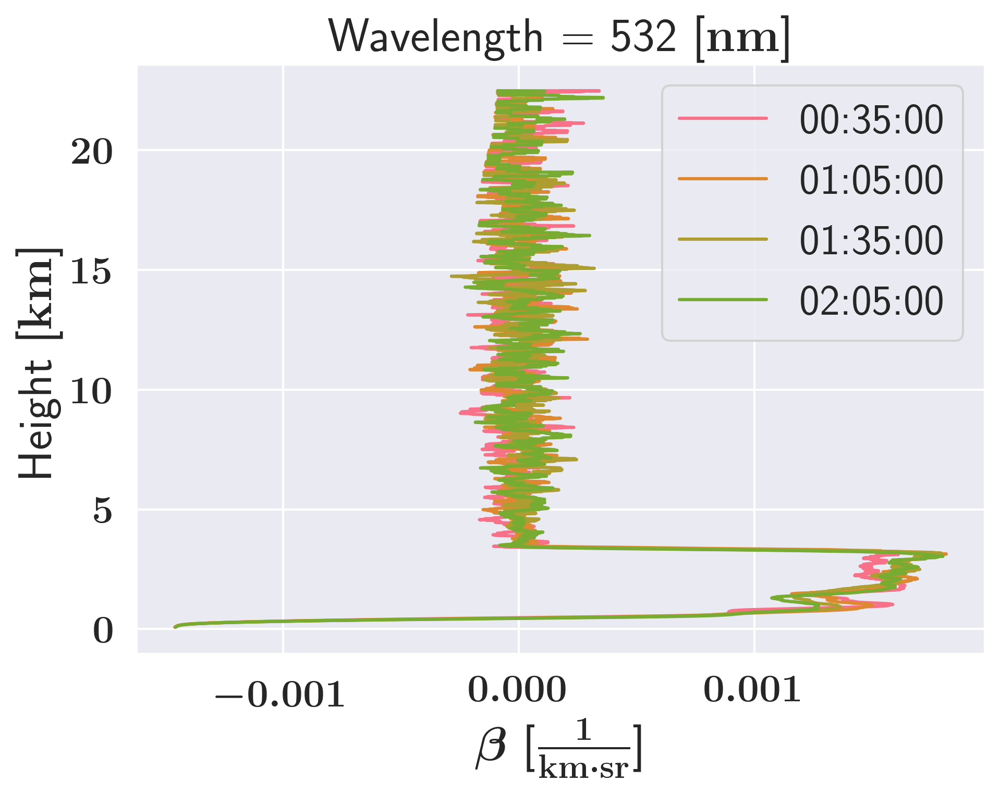

In [50]:
# sns.set_palette(sns.color_palette(sns.color_palette("husl", 10)))
# time_sample = xr.IndexVariable(dims='Time',data=profiles_time)
# daily_beta_profiles= daily_beta_chan.sel(Time=time_sample)
#
# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,5))
# times = [profiles_time[ind] for ind in [3,6,9,12]]#,5,7,-7,-5,-3]] #profiles_time[0::40]
# label_times = [dt.strftime('%H:%M:%S') for dt in times]
# daily_beta_profiles.sel(Time =times ).beta.plot(y='Height',hue='Time', ax=ax)
# ax.legend(label_times)
# plt.show()

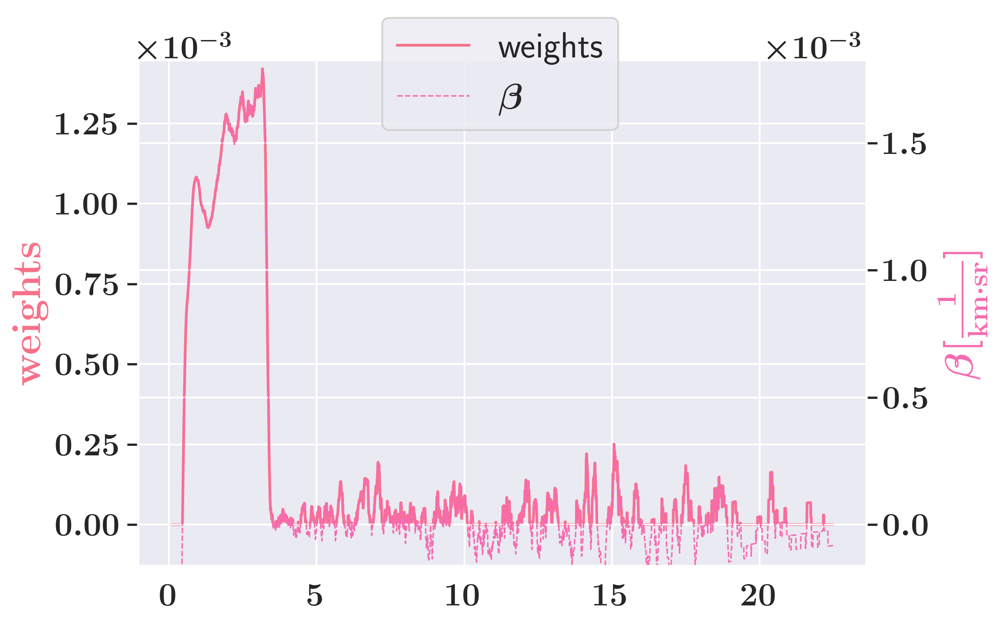

In [54]:

# colors = sns.color_palette("husl", 18)

# Define data input
# k_time =2
# heights = daily_beta_profiles.Height.values
# n_bins_height = heights.shape[0]
# values_beta = daily_beta_profiles.sel(Time =times[k_time]).beta.values.reshape(n_bins_height)
#
#
#
# X = np.linspace(start=heights[0],stop=heights[-1],num=n_bins_height, endpoint=True )
# X_sample = np.linspace(start=heights[0],stop=heights[-1],num=2*n_bins_height, endpoint=True )
# Y = np.interp(X_sample,heights,values_beta) #values_beta
#
# weights = Y.copy()
# weights[weights<0]=gs.eps
# weights = weights/sum(weights)
#
# # Set ylims scales
# scale=weights.max()/Y.max()
# diff2 =  Y.max()- Y.min()
# ylims2 = [0-0.05*diff2,values_beta.max()+0.01*diff2]
# ylims1 = np.array(ylims2)*scale
#
# # Plot weights and beta
# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=[8, 5])
# ax.set_ylim(ylims1)
# color1 = colors[0]
# color2 = colors[-1]
#
# l1 = ax.plot(X_sample,weights,label='weights', color =color1)
# ax.set_ylabel(r'$\rm weights$', color=color1)
# ax2 = ax.twinx()
# l2 = ax2.plot(X_sample,Y,label=r'$\beta$', color =color2,linestyle='--',linewidth=0.8)
# ax2.set_ylim(ylims2)
# ax2.set_ylabel(r'$\beta \big[\rm \frac{1}{km \cdot sr}\big]$', color=color2)
# ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
#
# ax2.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
# fig.legend(loc="upper center")
# fig.tight_layout()
# plt.show()


Saving fig to figures\ Gaussian representation of 1D backscatter haifa 2017-10-02 01-35-00 UTC


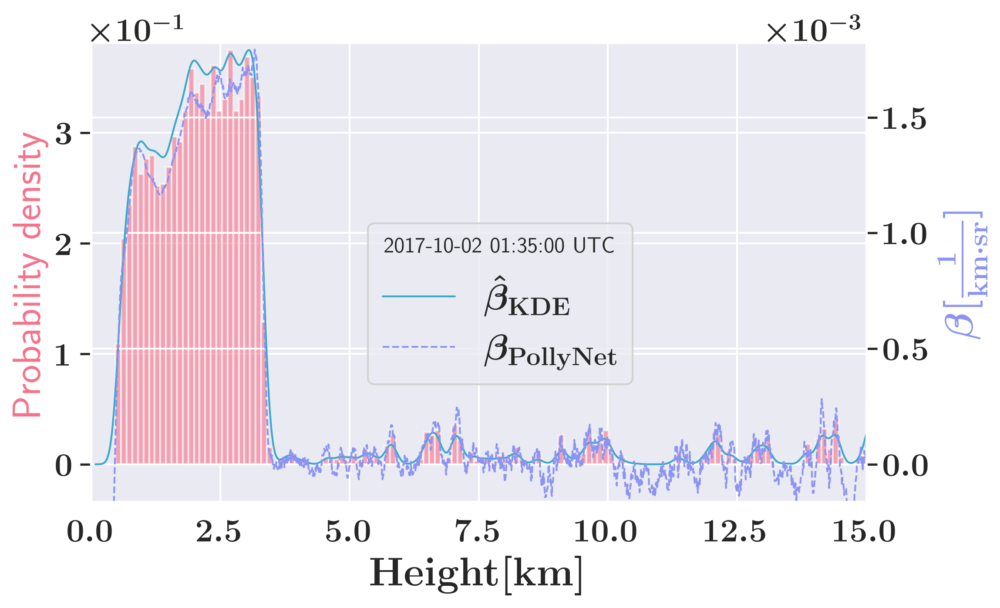

In [52]:
# K = 6000
# x_samples = random.choices(population=X_sample,  # list to pick from
#                            weights=weights,  # weights of the population, in order
#                            k=K  # amount of samples to draw
# )
# x_samples.sort()
# gmms=[]
# gmm_ys = []
# gmm_y_sums=[]
# num_components = [7,11] #5,8
#
# for nc in num_components:
#     # Fit GMM
#     gmm = GaussianMixture(n_components=nc, covariance_type="full", tol=0.001)
#     gmm = gmm.fit(X=np.expand_dims(x_samples, 1))
#     gmms.append(gmm)
#
#     # Evaluate GMM
#     gmm_y = np.exp(gmm.score_samples(X.reshape(-1, 1)))
#     gmm_ys.append(gmm_y)
#
#     # Construct function manually as sum of Gaussians
#     gmm_y_sum = np.full_like(X, fill_value=0, dtype=np.float32)
#     for m, c, w in zip(gmm.means_.ravel(), gmm.covariances_.ravel(),
#                    gmm.weights_.ravel()):
#         gmm_y_sum += gauss_function(x=X, amp=w, x0=m, sigma=np.sqrt(c))/nc
#
#     # Normalize so that integral is 1
#     gmm_y_sum /= np.trapz(gmm_y_sum, X)
#     gmm_y_sums.append(gmm_y_sum)
#
# # Fit and EVALUATE KDE
# bw_height = 0.1# [km]
# kde = KernelDensity(kernel="gaussian", bandwidth=bw_height).fit(np.array(x_samples)[:, np.newaxis])
# kde_y = np.exp(kde.score_samples((X.reshape(-1, 1))))+gs.eps
#
# # Make normalized histogram
# fig, ax = plt.subplots(nrows=1, ncols=1, figsize=[8, 5],linewidth=.5)
# counts= ax.hist(np.array(x_samples), bins=200,density=True, alpha=0.6)
# # Define scales of yyaxis
# scale = counts[0].max()/Y.max()
# diff2 =  Y.max()- Y.min()
# ylims2 = [0-0.05*diff2,Y.max()+0.01*diff2]
# ylims1 = np.array(ylims2)*scale
# ax.set_ylim(ylims1)
# ax.set_ylabel("Probability density", color=color1)
# ax.set_xlabel(r"$\rm Height[km]$")
# ax.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
# # Plot samples of x
# #ax.plot(x_samples, -0.005 - 0.01 * np.random.random(np.array(x_samples).shape[0]), "+k")
#
#
# ax2 = ax.twinx()
# for ind,(nc, gmm_y) in enumerate(zip(num_components,gmm_ys)):
#     indc = ind*2+2
#     beta_gmm =Y.max()*gmm_y/gmm_y.max()+gs.eps
#     #ax2.plot(X, beta_gmm, lw=1.0, label=rf"$\hat{{\beta}}_{{\rm GMM - {nc}}}$", color = colors[indc])
# beta_kde =Y.max()*kde_y/kde_y.max()
#
# ax2.plot(X, beta_kde, lw=1.0, label=r"$\hat{\beta}_{\rm KDE}$", color = colors[indc+2+5])
# ax2.set_ylabel(r'$\beta \big[\rm \frac{1}{km \cdot sr}\big]$', color=colors[indc+7+2])
# ax2.plot(heights,values_beta,label=r'$\beta_{\rm PollyNet}$', linestyle='--',linewidth=1.0, color= colors[indc+7+2])
# ax2.set_ylim(ylims2)
# ax2.ticklabel_format(axis='y',style='sci',scilimits=(0,0))
# ax.set_xlim([0,15])
#
#
# str_date=f"{day_date.strftime('%Y-%m-%d')} {label_times[k_time]} UTC"
# fig.legend( title=str_date,loc="center")
# plt.tight_layout()
# if SAVE_FIG:
#     # clean_title = ''.join(char for char in suptitle if char.isalnum())
#     suptitle = f" Gaussian representation of 1D backscatter {station_name} {str_date}".replace(':','-')
#     fig_path = os.path.join('figures', suptitle)
#     print(f"Saving fig to {fig_path}")
#     plt.savefig(fig_path + '.png', bbox_inches='tight')
#     plt.savefig(fig_path + '.svg', bbox_inches='tight')
# plt.show()

# Analyse finer PollyNet retrievals
### 1. Load calibration csv from TROPOS or Extract profiles data required for analysis

In [7]:
station_name='haifa'
station = gs.Station(station_name)
day_date = datetime(2017,10,2)
daily_times = station.calc_daily_time_index(day_date)
wavelength = 532
TGRS_folder = r'C:\Users\addalin\Dropbox\Lidar\Adi_TGRS'
figs_folder = os.path.join(TGRS_folder,'figures')
name_str = f"TGRS_TROPOS_{day_date.strftime('%Y-%m-%d')}_profiles"
table_name = name_str+"_info.csv"
profiles_ds_name = name_str+".nc"
GEN_PROFILES = False # True - crate and save the profiles; False - upload previous generated data
SAVE_FIG = False
LOAD_CLIB_CSV = False
FORMAT_FIG = 'jpg' # 'svg'
max_height = 15 # km
height_slice=slice(0,max_height)


if GEN_PROFILES:
    if LOAD_CLIB_CSV:
        # Load calibration dataset # Extract the data parameters of the data from pollynet '+lidar_calibration_constant.csv'
        pollynet_calib_path = 'pollyxt_tropos_calibration_lidar_calibration_constant.csv'
        polly_calib = pd.read_csv(os.path.join(TGRS_folder, pollynet_calib_path))
        polly_calib['cali_start_time']= pd.to_datetime(polly_calib['cali_start_time'])
        polly_calib['cali_stop_time']= pd.to_datetime(polly_calib['cali_stop_time'])
        polly_calib['date'] = polly_calib['cali_start_time'].dt.date
        method = 'Klett_Method'
        telescope = 'far_range'
        df_calib =  polly_calib[polly_calib.date == day_date.date()][polly_calib.wavelength ==wavelength][polly_calib.telescope==telescope][polly_calib.cali_method==method]
        df_calib = ds_utils.add_profiles_values(df_calib, station, day_date, file_type='profiles')
        df_calib = df_calib.rename({'liconst': 'LC', 'uncertainty_liconst': 'LC_std', 'matched_nc_profile': 'profile_path',
                   'cali_start_time':'start_time_period','cali_stop_time':'end_time_period'},
                            axis='columns')
        display(df_calib)
    else:
        # Extract profiles data
        df_calib = None
    daily_beta_chan, daily_datset_df = daily_backscatter_from_profiles(day_date=day_date, station=station, df_calib=df_calib, wavelength=532)

    # save profiles info and values
    xr_utils.save_dataset(dataset=daily_beta_chan,folder_name=TGRS_folder,nc_name=profiles_ds_name)
    daily_datset_df.to_csv(os.path.join(TGRS_folder,table_name))
else:
    # upload profiles info and values
    daily_beta_chan = xr_utils.load_dataset(os.path.join(TGRS_folder,profiles_ds_name))
    daily_datset_df = pd.read_csv(os.path.join(TGRS_folder,table_name))

valid_times = [datetime.strptime(str(t),'%Y-%m-%d %H:%M:%S') for t in daily_datset_df[daily_datset_df['valid']]['mid_time_period']]


In [5]:
daily_beta_chan

<xarray.Dataset>
Dimensions:      (Time: 2880, Wavelength: 1, Height: 3000)
Coordinates:
  * Time         (Time) datetime64[ns] 2017-10-02 ... 2017-10-02T23:59:30
  * Height       (Height) float64 0.07875 0.08622 0.09369 ... 22.47 22.48 22.49
  * Wavelength   (Wavelength) int32 532
Data variables:
    beta         (Wavelength, Height, Time) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
    date         datetime64[ns] 2017-10-02
    beta_ratio   (Wavelength, Height, Time) float32 nan nan nan ... nan nan nan
    ratio        (Wavelength, Height, Time) float32 nan nan nan ... nan nan nan
    interp_beta  (Wavelength, Height, Time) float32 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes:
    location:  Haifa

In [24]:
if LOAD_CLIB_CSV:
    da = polly_calib.set_index(['cali_start_time','wavelength','cali_method','id']).to_xarray()
    time_slice= slice(day_date,day_date+timedelta(hours=24))
    da.sel(wavelength=wavelength, cali_start_time=time_slice).plot.scatter(y='liconst' ,x = 'cali_start_time', hue='cali_method', figsize=(15,7), s=2)
    plt.show()

### 4. Show daily aerosol coefficients

C:\Users\addalin\AppData\Local\Temp\ipykernel_29392\1513445115.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


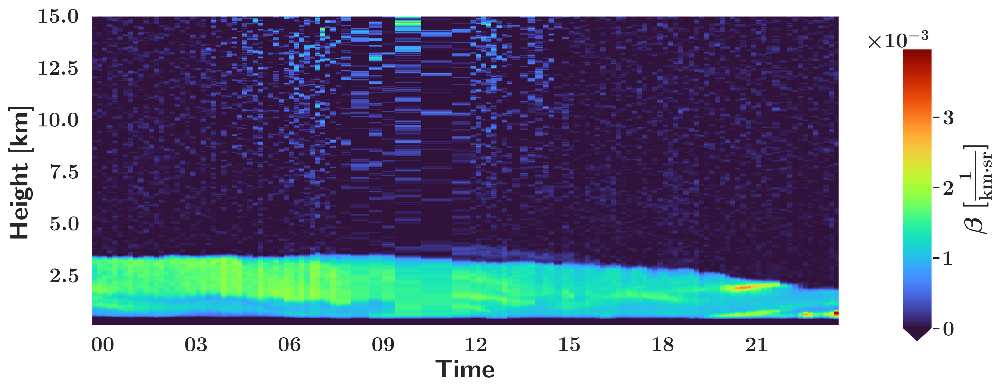

(None,
 <Figure size 3600x1500 with 2 Axes>,
 <AxesSubplot:xlabel='\\textbf{Time}', ylabel='\\textbf{Height} [$\\rm \\textbf{km}$]'>)

In [5]:
:plot_daily_profile_for_publish(daily_beta_chan.sel(Time=valid_times).beta,
                            height_slice=height_slice,#, threshold= 2.5e-3 )
                            figsize=(12,5),save_fig=SAVE_FIG,
                            folder_name=figs_folder, format_fig=FORMAT_FIG)

### 5. Set and apply ratio to remove nonsense values, e.g., due to sun scatter.
### In addition removing negative values. Note that beta ratio will be used as weights for sampling, therefore, values must be positive.

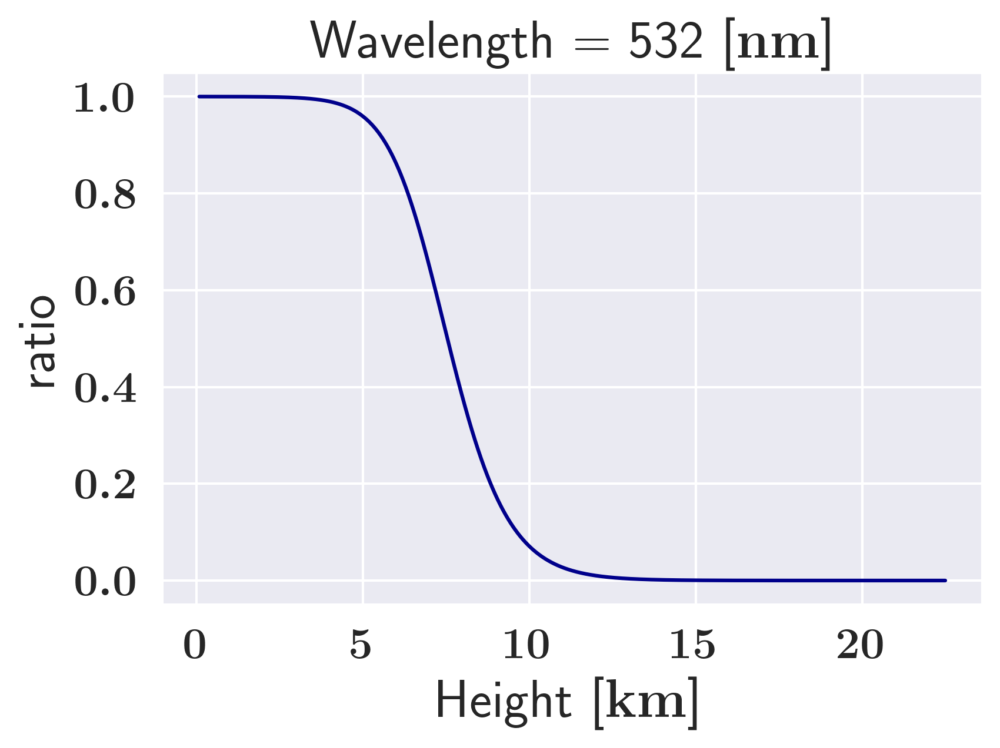

C:\Users\addalin\AppData\Local\Temp\ipykernel_23360\1513445115.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


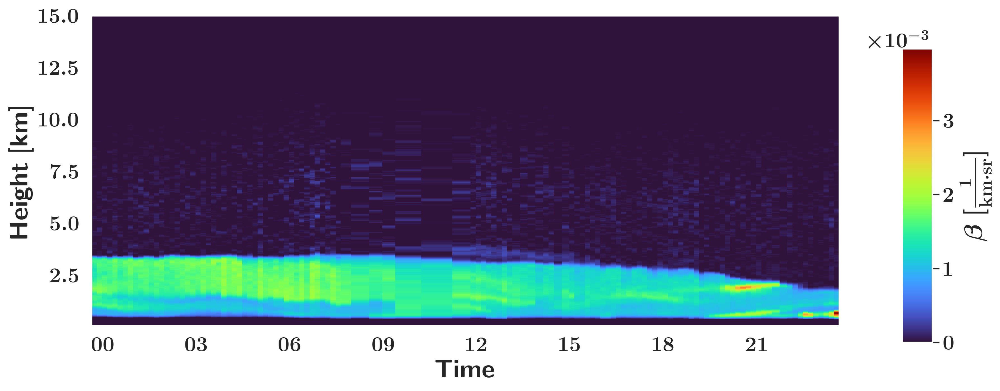

Range of backscatter coefficients in heights of slice(0, 15, None)[km] for orig beta:[-0.0016, 0.0040], after ratio: [0.0000, 0.0040]


In [8]:
sub_beta= daily_beta_chan.sel(Time=valid_times)

if GEN_PROFILES:
    # Set ratio
    ratio = xr.apply_ufunc(lambda x :gen_utils.sigmoid(daily_beta_chan.Height,x0=7,A=2,v=1.5)-1,
                           daily_beta_chan.Height, keep_attrs=True).\
        broadcast_like(sub_beta.beta).assign_attrs({'info': "Height-dependent ratio to apply on backscatter to reduce nonsense values",
                                                                  'name': 'ratio'})
    # Apply ratio
    beta_ratio = xr.apply_ufunc(lambda x,ratio: x*ratio,
                                sub_beta.beta.clip(min = gs.eps),
                                ratio,keep_attrs=True).fillna(gs.eps)
    beta_ratio.attrs['info']+=' - followed by ratio to reduce nonsense values.'
    # Add data arrays to  daily_beta_chan and save
    daily_beta_chan = daily_beta_chan.assign(beta_ratio=beta_ratio, ratio=ratio)
    xr_utils.save_dataset(dataset=daily_beta_chan,folder_name=TGRS_folder,nc_name=profiles_ds_name)
else:
    ratio = daily_beta_chan.ratio
    beta_ratio = daily_beta_chan.sel(Wavelength = wavelength).beta_ratio

# Plot ration and bet_ratio
ratio.mean(dim='Time').plot()
plt.show()
:plot_daily_profile_for_publish(beta_ratio.sel(Time=valid_times),height_slice=height_slice,
                            figsize=(12,5),save_fig=SAVE_FIG,
                            folder_name=figs_folder, format_fig=FORMAT_FIG)


print(f"Range of backscatter coefficients in heights of {height_slice}[km] for orig beta:"
      f"[{sub_beta.sel(Height= height_slice).beta.min().item():.4f}, {sub_beta.sel(Height= height_slice).beta.max().item():.4f}], "
      f"after ratio: [{beta_ratio.sel(Height= height_slice).min().item():.4f}, {beta_ratio.sel(Height= height_slice).max().item():.4f}]")

### 6. plot histogram

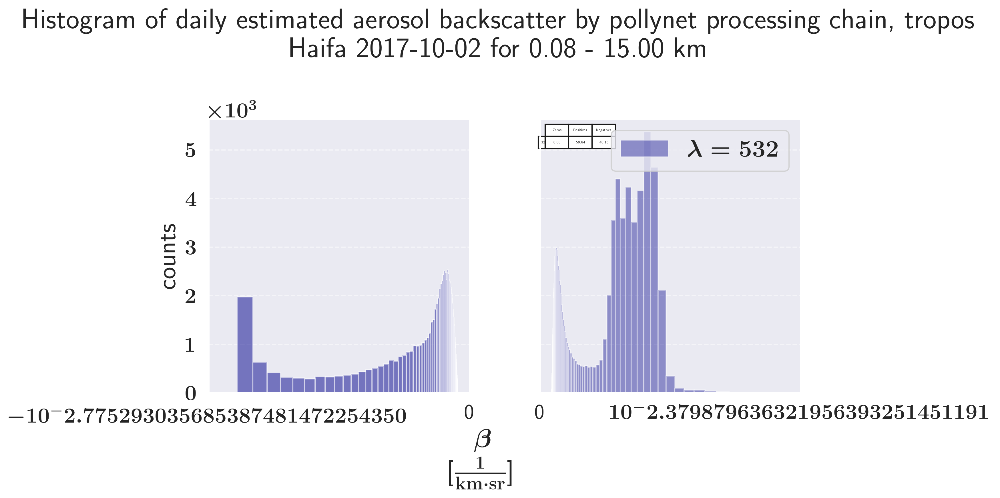

(<Figure size 3600x1800 with 2 Axes>,
 array([[<AxesSubplot:xlabel='$\\beta $\n[$\\rm \\frac{1}{km \\cdot sr}$]', ylabel='counts'>,
         <AxesSubplot:>]], dtype=object),
 [<xarray.Dataset>
  Dimensions:     (Wavelength: 1, Type: 3, Stats: 3)
  Coordinates:
    * Stats       (Stats) <U8 'zero' 'positive' 'negative'
    * Wavelength  (Wavelength) int32 532
  Dimensions without coordinates: Type
  Data variables:
      stats       (Wavelength, Type) object '0.00' '59.84' '40.16'
      index       int32 0
      start_time  datetime64[ns] 2017-10-02T00:04:30
      end_time    datetime64[ns] 2017-10-02T23:54:30],
 None)

In [7]:
vis_utils.daily_ds_histogram(daily_beta_chan.sel(Time=valid_times), profile_type='beta',
                       SAVE_FIG=SAVE_FIG, n_temporal_splits=1,
                       nbins=200, figsize=(12, 6), height_range= height_slice,
                       dst_folder=os.path.join(os.path.abspath(os.curdir), 'figures'),
                       format_fig=FORMAT_FIG)

In [18]:
#sns.histplot(data=daily_beta_chan.sel(Time=valid_times, Wavelength=532).beta)
#plt.show()

### 6. Time interpolated backscatter

C:\Users\addalin\AppData\Local\Temp\ipykernel_29392\1513445115.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


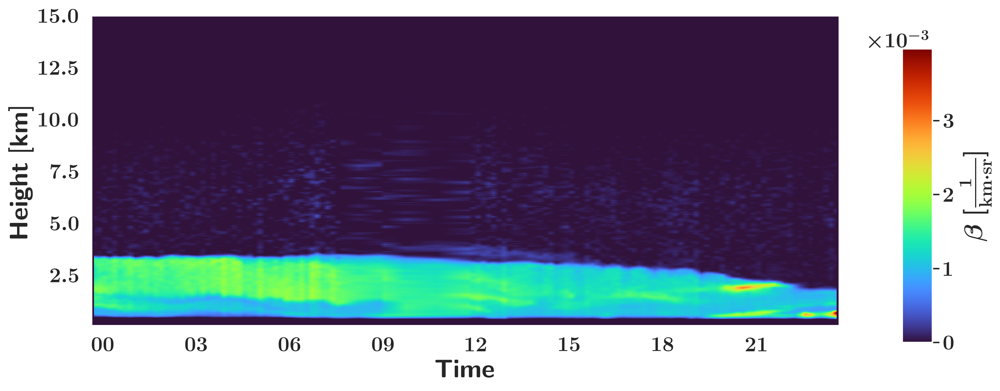

(None,
 <Figure size 3600x1500 with 2 Axes>,
 <AxesSubplot:xlabel='\\textbf{Time}', ylabel='\\textbf{Height} [$\\rm \\textbf{km}$]'>)

In [8]:
if GEN_PROFILES:
    interp_beta =  beta_ratio.interp(Time=daily_times).fillna(0.0) # sub_beta.beta.interp(Time=daily_times).fillna(0.0)
    interp_beta.attrs['info'] = 'Time interpolation of estimated aerosol backscatter profiles by PollyNet Processing Chain, Tropos'
    daily_beta_chan = daily_beta_chan.assign(interp_beta=interp_beta)
    xr_utils.save_dataset(dataset=daily_beta_chan,folder_name=TGRS_folder,nc_name=profiles_ds_name)
else:
    interp_beta = daily_beta_chan.interp_beta


:plot_daily_profile_for_publish(daily_beta_chan.interp_beta,height_slice=height_slice,
                            figsize=(12,5),save_fig=SAVE_FIG,
                            folder_name=figs_folder, format_fig=FORMAT_FIG)


# 2D KDE

## Define input to the KDE:
1. Locations (x_samples, y_samples) on a grid XY_samples
2. Weights of samples.  The weights are set according to the normalized backscatter values (here the normalization is on sum of backscatters values). Ignoring nan, and negative values.

In [15]:
# # Set xy samples locations:
# max_height = 15 # km
# heights = daily_beta_chan.sel(Height= slice(0,max_height)).Height.values
# y = heights
#
# #scaling time dimension, since the BW currently is equal to both dimensions (in sklearn, not sure regardig scipy)
# SCALE_TIME = False
# if SCALE_TIME:
#     bw_height = 0.1# [km]
#     bw_time = 300 # [sec] --> 10 min = 600 sec
#     scale_time = bw_time/bw_height
# else:
#     scale_time = 1.0
#     bw_height =''
#     bw_time =''
#
# x_samples= np.array([(t-day_date).seconds for t in valid_times])/scale_time
# X_samples,Y_samples = np.meshgrid(x_samples, y, indexing='xy')
# XY_samples = np.vstack([X_samples.reshape(X_samples.size), Y_samples.reshape(X_samples.size)])
#
# # Set xy samples weights:
# W_samples = daily_beta_chan.sel(Time=valid_times,Height= slice(0,max_height)).beta.values.copy().reshape(X_samples.shape)
# cond_non_valid = np.logical_or(np.isnan(W_samples),W_samples<0)
# W_samples[cond_non_valid] = gs.eps
# W_samples/=W_samples.sum()  # normalizing weights

## Define a full grid of the result

In [148]:
# # Set full XY grid
# timeIndx = station.calc_daily_time_index(day_date)-day_date
# x = np.array([t.seconds for t in timeIndx])/scale_time
# step_x = 1
# step_y = 1
# X,Y = np.meshgrid(x[::step_x], y[::step_y], indexing='xy')
# XY = np.vstack([X.reshape(X.size), Y.reshape(X.size)])
# XY.shape, X.shape

((2, 6137280), (2131, 2880))

## Testing KernelDensity of sklearn

In [70]:
# estimate the kernel given locations and values
#kde_2D = KernelDensity(kernel="gaussian", bandwidth= bw_height).fit(X=XY_samples.T, sample_weight=W_samples.reshape(X_samples.size))
#kde_y = np.exp(kde.score_samples((X.reshape(-1, 1))))+gs.eps
#kde_2D


### Apply the kernel on a grid

In [71]:
#res_KDE_2D = np.exp(kde_2D.score_samples(XY[:,1:50].T)) #+gs.eps
#res_KDE_2D

### Testing gaussian_kde of scipy

C:\Users\addalin\AppData\Local\Temp\ipykernel_25556\3092742860.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


Saving fig to figures\2D KDE SciPy representation of aerosol backscatter estimated by PollyNet Processing Chain, Tropos. Timescale 1 max height10km - 2017-10-02


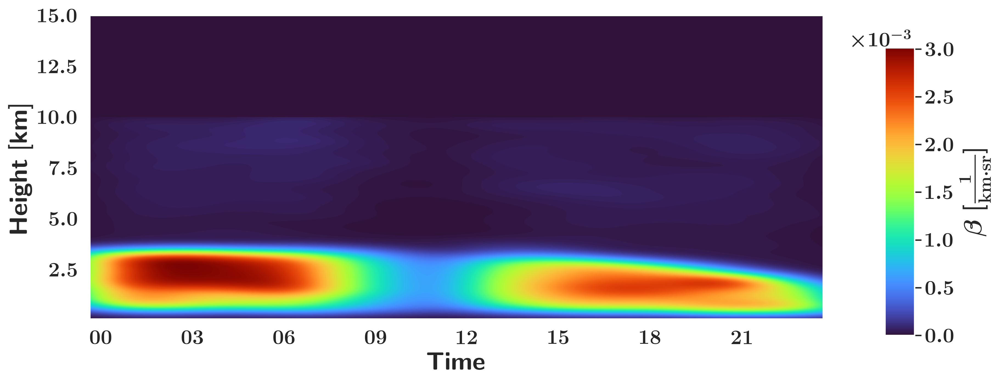

'C:\\Users\\addalin\\Dropbox\\Lidar\\lidar_learning\\Analysis\\figures\\Backscatter KDE SciPy 2017_10_02 timescale 1.nc'

In [78]:
# kernel = stats.gaussian_kde(XY_samples, weights= W_samples.reshape(X_samples.size))
# Z = np.reshape(kernel(XY).T, X.shape)
# # converting to beta units
# beta_max =  daily_beta_chan.sel(Time=slice(day_date, day_date+timedelta(hours=21)),Height=slice(0,max_height)).beta.max().item() # 2.8e-3
# new_beta = beta_max*proc_utils.normalize(Z.copy())
#
# # Creating new xr dataset
# new_grid_seconds = X[0,:]*scale_time
# new_times = [day_date+timedelta(seconds=sec) for sec in new_grid_seconds]
# new_beta_da = xr.zeros_like(daily_beta_chan)
# new_beta_da.beta.loc[dict(Height=slice(0,max_height), Time=new_times, Wavelength=wavelength)]= new_beta.reshape((len(y), len(new_times)))
# #new_beta_da['beta'] = xr.apply_ufunc(lambda x, r: r*proc_utils.normalize(x), new_beta_da.beta, beta_max, keep_attrs=True)
# new_beta_da['date'] = day_date
# source_function = 'SciPy'
# new_beta_da.beta.attrs = {'long_name': r'$\beta $',
#                            'units': r'$\rm \frac{1}{km \cdot sr}$',
#                            'info': f"2D KDE {source_function} representation of aerosol backscatter estimated by PollyNet Processing Chain, Tropos. Timescale {round(scale_time)} max height{max_height}km"}
#
# # Plotting the results
# :plot_daily_profile_for_publish(new_beta_da.beta,height_slice=height_slice,figsize=(12,5),save_fig=SAVE_FIG)
#
#
# # Saving to nc file
# new_beta_da.beta.attrs = {'long_name': r'$\beta $',
#                            'units': r'$\rm \frac{1}{km \cdot sr}$',
#                            'info': f"2D KDE representation of aerosol backscatter estimated by PollyNet Processing Chain, Tropos."
#                                    f" Timescale:{scale_time} [sec / km], bw_height: {bw_height}[km], bw_time: {bw_time}[sec], "
#                                    f"method: {source_function}, beta_max:{beta_max:.4f} [1/km sr]"}
#
# nc_fname = f"Backscatter KDE {source_function} {day_date.strftime('%Y_%m_%d')} timescale {round(scale_time)}.nc"
# nc_path = os.path.join(os.path.abspath(os.curdir),'figures',nc_fname)
# xr_utils.save_dataset(new_beta_da,nc_path= nc_path,optim_size=False)

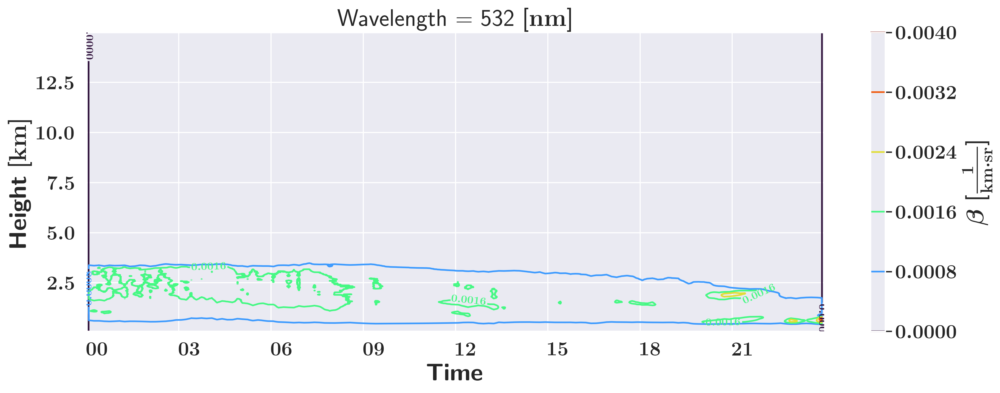

Num levels =6  at values: [0.     0.0008 0.0016 0.0024 0.0032 0.004 ]


In [9]:
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(15, 5))
CS = xr.plot.contour(daily_beta_chan.sel(Wavelength = 532, Height=slice(0,15)).interp_beta,
                add_labels = True, add_colorbar =True, ax= ax,cmap= 'turbo')
ax.clabel(CS, inline=True, fontsize=10)
ax.set_rasterization_zorder(-10)
ax.xaxis.set_major_formatter(TIMEFORMAT)
ax.xaxis.set_tick_params(rotation=0)
#
ax.set_ylabel(ax.get_ylabel().replace("Height", r'\textbf{Height}'))
ax.set_xlabel(ax.get_xlabel().replace("Time", r'\textbf{Time}'))
for tick in ax.xaxis.get_majorticklabels():
    tick.set_horizontalalignment("left")
if SAVE_FIG:
    #if folder_name is None:
    folder_name = figs_folder #os.path.join(os.path.abspath(os.path.curdir),'figures')
    stitile = f"Contours of beta for {day_date.strftime('%Y-%m-%d')}"
    fig_path = vis_utils.save_fig(fig, fig_name=stitile,
                                       folder_name=folder_name,
                                       format_fig=FORMAT_FIG)
plt.show()
levels = CS.levels
print(f"Num levels ={len(levels)}  at values: {levels}")

In [10]:
min_vals = levels[0:-1][0::1]
max_vals = min_vals[1::1].tolist()
max_vals.append(daily_beta_chan.sel(Wavelength = 532, Height=slice(0,15) ).interp_beta.max().item())
min_vals, max_vals

(array([0.    , 0.0008, 0.0016, 0.0024, 0.0032]),
 [0.0008, 0.0016, 0.0024000000000000002, 0.0032, 0.003970980644226074])

In [9]:
def sample_level(X:np.ndarray,Y:np.ndarray, weights:np.ndarray, n_iter=10,  total_samples = 10000):
    # estimate xy samples
    weight_vector = weights.values.reshape(X.size)
    XY= np.vstack([X.reshape(X.size), Y.reshape(X.size)])
    print(weight_vector.shape)
    sampels_per_iter = round(total_samples/n_iter)
    XY_s = []
    for n_samples in range(n_iter):
        # Sample indexes of (x,y) locations according to weight vector

        inds = random.choices(population=np.arange(weight_vector.shape[0]),  # list to pick from
                              weights=weight_vector,  # weights of the population, in order
                              k=sampels_per_iter,  # amount of samples to draw

        )
        inds.sort()
        XY_s.append(XY[:,inds])

    XY_samples = np.concatenate(XY_s, axis=1)

    # Show samples
    plt.scatter(XY_samples[0], XY_samples[1], s=.1)
    plt.show()

    # Show 2D histogram
    d_x = X[0,1] - X[0, 0]
    d_y = Y[1,0] -Y[0, 0]

    edges_x = X[0,:]+.5*d_x
    edges_y = Y[:,0]+.5*d_y
    edge0_x = np.array(X[0, 0]-.5*d_x).reshape(1)
    edge0_y = np.array(Y[0, 0]-.5*d_y).reshape(1)
    edges_x = np.append(edge0_x,edges_x,axis=0)
    edges_y = np.append(edge0_y,edges_y,axis=0)
    H, yedges, xedges = np.histogram2d(XY_samples[0], XY_samples[1], bins=(edges_x, edges_y))
    kernel_weights_da = xr.DataArray(data=H.T,coords={'y':Y[:,0], 'x':X[0,:]},attrs={'long_name':r'$N_s$'})
    kernel_weights_da.plot(cmap='turbo')
    plt.show()

    return XY_samples, kernel_weights_da

(243756,)


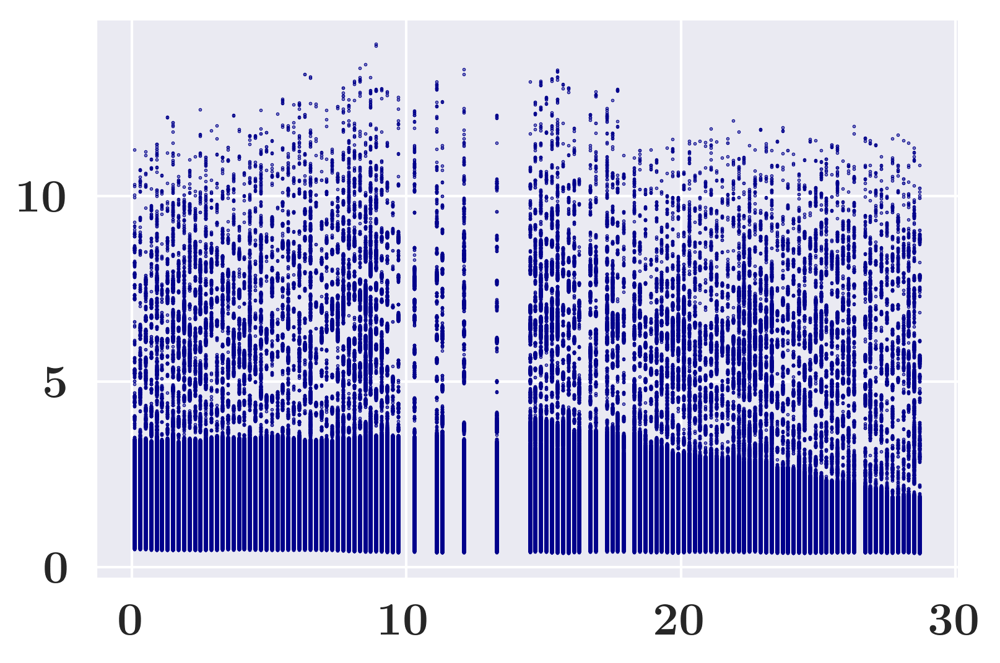

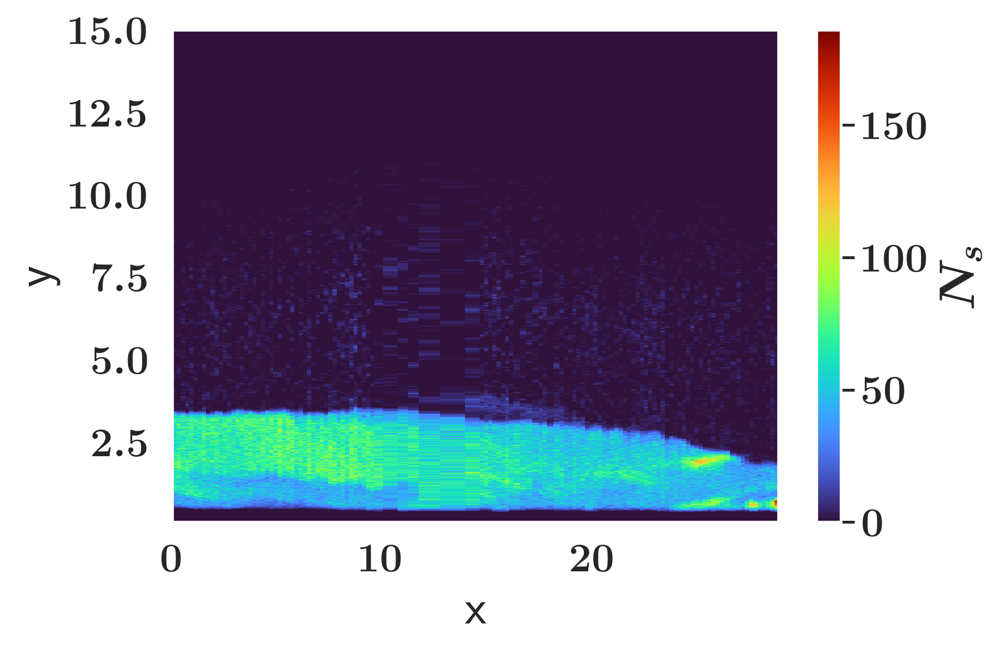

In [13]:
#scaling time dimension, since the BW currently is equal to both dimensions (in sklearn, not sure regardig scipy)
SCALE_TIME = True
if SCALE_TIME:
    bw_height = 0.1# [km]
    bw_time = 300 # [sec] --> 10 min = 600 sec
    scale_time = bw_time/bw_height
else:
    scale_time = 1.0
    bw_height =''
    bw_time =''

beta_ratio.sel(Time=valid_times)
# Set xy samples locations:
y = daily_beta_chan.sel(Height= slice(0,max_height)).Height.values
x = np.array([(t-day_date).seconds for t in valid_times])/scale_time

X,Y = np.meshgrid(x, y, indexing='xy')
XY_orig = np.vstack([X.reshape(X.size), Y.reshape(X.size)])
XY_orig
total_samples = len(valid_times)*len(y)*10
n_iter = len(valid_times)*10
samples, hist_2D = sample_level(X,Y, beta_ratio.sel(Time=valid_times,Height= slice(0,max_height)), n_iter=n_iter,  total_samples = total_samples)

Start GMM fit
Initialization 0
  Iteration 10	 time lapse 117.85403s	 ll change 14287.17665
  Iteration 20	 time lapse 111.42373s	 ll change 6378.42535
  Iteration 30	 time lapse 108.35128s	 ll change 5860.22883
  Iteration 40	 time lapse 109.90165s	 ll change 4856.12381
  Iteration 50	 time lapse 120.76161s	 ll change 2527.52946
Initialization converged: False	 time lapse 568.29230s	 ll -6525360.63111
Initialization 1
  Iteration 10	 time lapse 141.54317s	 ll change 12274.49371
  Iteration 20	 time lapse 114.68187s	 ll change 12067.45501
  Iteration 30	 time lapse 115.69604s	 ll change 5764.35459


KeyboardInterrupt: 

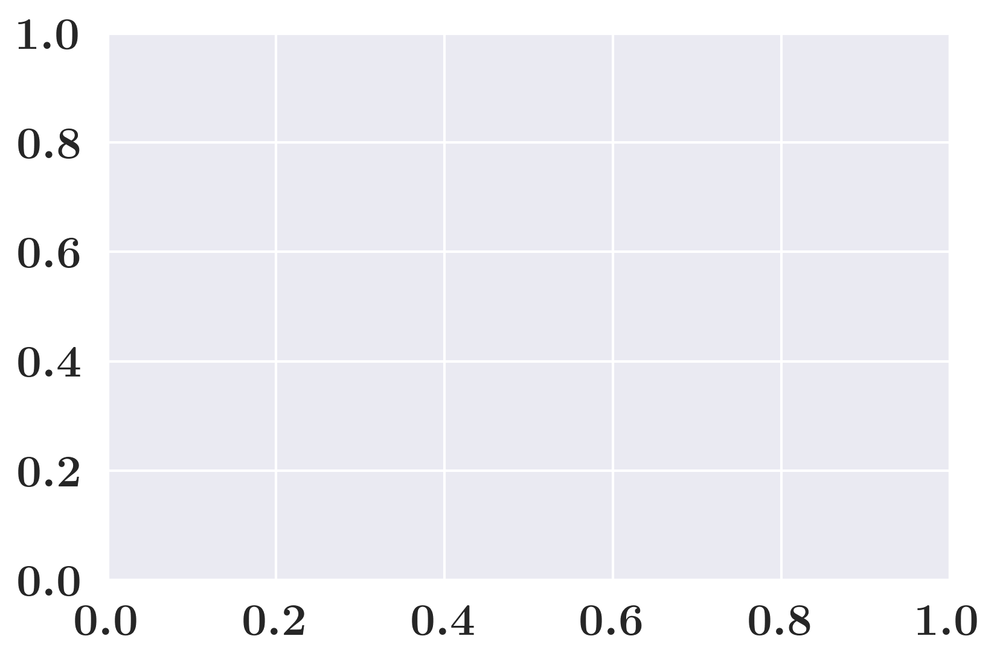

In [20]:


gmm = BayesianGaussianMixture(n_components=31,covariance_type="full",verbose=2,
                              tol=0.0001,reg_covar= 1e-7,max_iter=50, # increase max_iter
                              n_init=20,  init_params='k-means++') # mean_prior=(X[0,:].mean(),0.2)) # "tied", "diag", "full"
n_cols = 1
n_rows = 1
fig, ax = plt.subplots(nrows=n_rows, ncols=n_cols)
print('Start GMM fit')
tic_fit=TicToc()
tic_fit.tic()
gmm.fit(samples.T)
tic_fit.toc()

In [ ]:
print('calculate log-likelihood on the grid')
tic_score=TicToc()
tic_score.tic()
z = gmm.score_samples(XY_orig.T) # Note that this method returns log-likelihood
z = np.exp(z) # e^x to get likelihood values
z = z.reshape(X.shape)
tic_score.toc()
#beta_max = weights.max().item()-weights.min().item()
new_beta = proc_utils.normalize(z.copy())
img = ax.contourf(x, y, new_beta, 100, cmap="turbo")
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
plt.colorbar(img, cax=cax, orientation='vertical')
plt.show()

In [ ]:
# Set xy grid :
time_scale = 3600
timeIndx = daily_times-day_date
x = np.array([t.seconds/(time_scale) for t in timeIndx]) #t.seconds
y = daily_beta_chan.Height.values
step_x = 1
step_y = 1
X,Y = np.meshgrid(x[::step_x], y[::step_y], indexing='xy')
XY = np.vstack([X.reshape(X.size), Y.reshape(X.size)])

# Set weights for each level
weights_levels =[]
samples_levels = []
histograms_2D = []
n_iterations = [600,500,300,100,50]
for ind,(min_val,max_val, n_iter) in enumerate(zip(min_vals,max_vals, n_iterations)):
    print(f'Sampling level {ind+1} at values= [{min_val:.4f},{max_val:.4f}]')
    weights = interp_beta.clip(min = min_val,max =max_val+gs.eps, keep_attrs=True )-min_val
    weights =weights.fillna(gs.eps)
    beta_max =   weights.max().item()
    weights/=weights.sum()  # Normalize the weights

    weights_levels.append(weights)
    samples, hist_2D = sample_level(X,Y, weights, n_iter=n_iter,  total_samples = 20000)
    samples_levels.append(samples)
    histograms_2D.append(hist_2D)

Sampling level 1 at values= [0.0000,0.0008]
(8640000,)


C:\Users\addalin\.conda\envs\lidar_local_new\lib\site-packages\sklearn\mixture\_base.py:277: ConvergenceWarning: Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


GMM_1: converged = False, weights of covariances: [0.07 0.09 0.09 0.13 0.11 0.12 0.08 0.04 0.09 0.02 0.16]
means : [[21.73323433  1.2709483 ]
 [ 5.87270601  3.02774769]
 [12.20395183  0.66650494]
 [15.90761502  1.26841347]
 [ 5.5196082   1.99585318]
 [17.46376521  2.29625534]
 [ 6.11474323  1.06606837]
 [ 8.23303449  6.63024876]
 [ 1.54680057  1.98023006]
 [19.16567062  5.47171996]
 [11.26079066  2.33073017]], covariances: [[[ 1.81332759e+00 -7.39309590e-02]
  [-7.39309590e-02  2.08622141e-01]]

 [[ 8.30824584e+00 -1.74694928e-02]
  [-1.74694928e-02  8.82033661e-02]]

 [[ 3.00112491e+01 -1.01083911e-01]
  [-1.01083911e-01  2.05879968e-02]]

 [[ 1.05373965e+01 -3.19763134e-01]
  [-3.19763134e-01  1.32406533e-01]]

 [[ 4.38147155e+00 -1.16765320e-01]
  [-1.16765320e-01  2.43718107e-01]]

 [[ 6.60020824e+00 -5.87470727e-01]
  [-5.87470727e-01  2.07451997e-01]]

 [[ 9.82233005e+00  2.24840429e-01]
  [ 2.24840429e-01  7.62290576e-02]]

 [[ 1.85066412e+01  1.39402282e-01]
  [ 1.39402282e-01 

C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\2859549502.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')
C:\Users\addalin\.conda\envs\lidar_local_new\lib\site-packages\sklearn\mixture\_base.py:277: ConvergenceWarning: Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


GMM_2: converged = False, weights of covariances: [0.11 0.1  0.08 0.17 0.07 0.1  0.1  0.1  0.09 0.03 0.05]
means : [[ 5.94252482  2.95543918]
 [17.05782092  1.43041995]
 [12.29936181  1.31402881]
 [ 8.4179442   2.18356656]
 [20.56621732  1.70320364]
 [13.91904402  2.42571236]
 [ 1.35174924  1.91894724]
 [ 7.377185    1.48607929]
 [ 3.66889169  2.2359853 ]
 [21.33570325  0.65355162]
 [ 9.48805441  0.79492806]], covariances: [[[ 8.66479529e+00 -2.15531590e-01]
  [-2.15531590e-01  5.20475362e-02]]

 [[ 4.28025437e+00  1.14030114e-01]
  [ 1.14030114e-01  1.48980640e-01]]

 [[ 2.57818874e+00  2.90319213e-01]
  [ 2.90319213e-01  1.48319114e-01]]

 [[ 7.89277695e+00 -4.76422390e-01]
  [-4.76422390e-01  1.56967972e-01]]

 [[ 2.93131239e+00 -3.84893724e-01]
  [-3.84893724e-01  1.88222933e-01]]

 [[ 6.00074899e+00 -2.13963443e-01]
  [-2.13963443e-01  1.14123172e-01]]

 [[ 7.73221987e-01 -5.02924125e-02]
  [-5.02924125e-02  4.00137058e-01]]

 [[ 6.29370066e+00 -2.55601457e-01]
  [-2.55601457e-01 

C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\2859549502.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')


GMM_3: converged = True, weights of covariances: [0.   0.2  0.12 0.03 0.06 0.01 0.07 0.11 0.2  0.05 0.15]
means : [[17.66135517  1.45514444]
 [ 4.25191492  2.55459075]
 [ 5.39403462  1.70078794]
 [ 0.51159678  1.88086173]
 [23.39714129  0.61615178]
 [12.52184176  1.42959963]
 [ 7.18290994  2.62541396]
 [ 2.69482693  2.97962074]
 [ 6.55775595  1.93002223]
 [21.15465268  0.64256727]
 [21.08345697  1.9219954 ]], covariances: [[[ 2.95702108  0.10355083]
  [ 0.10355083  0.05684979]]

 [[ 0.27313599 -0.02172286]
  [-0.02172286  0.16932767]]

 [[ 1.79461637 -0.24133925]
  [-0.24133925  0.0508252 ]]

 [[ 0.48710534 -0.02545257]
  [-0.02545257  0.03680045]]

 [[ 0.33021094  0.00691216]
  [ 0.00691216  0.00415853]]

 [[ 0.35661047 -0.01826553]
  [-0.01826553  0.01282492]]

 [[ 0.42709437 -0.06606857]
  [-0.06606857  0.06745587]]

 [[ 1.45875479  0.00613604]
  [ 0.00613604  0.03934142]]

 [[ 0.67852702 -0.13774666]
  [-0.13774666  0.09950831]]

 [[ 0.32615316  0.02113215]
  [ 0.02113215  0.004821

C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\2859549502.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')


GMM_4: converged = True, weights of covariances: [0.   0.36 0.55 0.09 0.   0.   0.   0.   0.   0.   0.  ]
means : [[11.99583333  0.2       ]
 [23.86593184  0.657326  ]
 [20.95475095  1.90582268]
 [22.96169004  0.60469354]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]], covariances: [[[ 9.58914127e-01 -4.23758306e-01]
  [-4.23758306e-01  1.97523396e-01]]

 [[ 2.10461712e-02  7.83314339e-04]
  [ 7.83314339e-04  2.80662267e-03]]

 [[ 2.62752683e-02  3.40190056e-03]
  [ 3.40190056e-03  1.60812723e-03]]

 [[ 7.09904987e-02  1.67710047e-03]
  [ 1.67710047e-03  8.61559447e-04]]

 [[ 9.58914127e-01 -4.23758306e-01]
  [-4.23758306e-01  1.97523396e-01]]

 [[ 9.58914127e-01 -4.23758306e-01]
  [-4.23758306e-01  1.97523396e-01]]

 [[ 9.58914127e-01 -4.23758306e-01]
  [-4.23758306e-01  1.97523396e-01]]

 [[ 9.58914127e-01 -4.23758306e-01]
  [-4.23758306e-01  

C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\2859549502.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')


GMM_5: converged = True, weights of covariances: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
means : [[23.89723618  0.67642584]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]
 [11.99583333  0.2       ]], covariances: [[[7.37081207e-03 3.18220809e-04]
  [3.18220809e-04 6.59244098e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  [1.73658322e-05 3.23930188e-04]]

 [[1.44462777e-04 1.73658322e-05]
  

C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\2859549502.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')


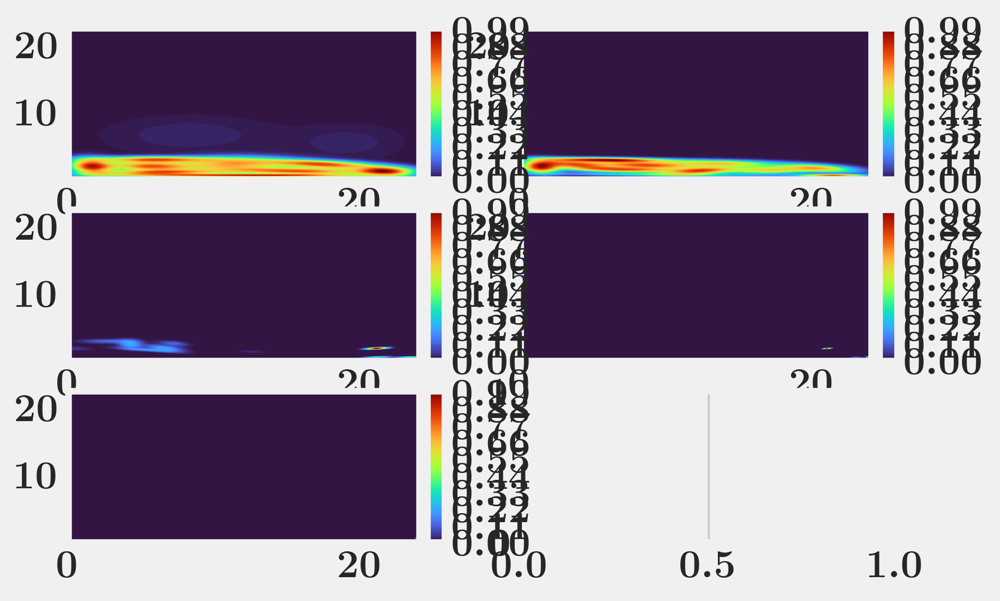

In [340]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
gmm = BayesianGaussianMixture(n_components=11,covariance_type="full",
                              tol=0.0001,reg_covar= 1e-7,max_iter=600, # increase max_iter
                              n_init=10, mean_prior=(X[0,:].mean(),0.2)) # "tied", "diag", "full"

betas=[]
gmms = []
n_cols = 2
n_rows = round(np.ceil(len(samples_levels)/n_cols))
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols)
for ind,(samples, weights, ax) in enumerate(zip(samples_levels, weights_levels,axes.ravel())):
    gmm.fit(samples.T)
    z = gmm.score_samples(XY.T) # Note that this method returns log-likelihood
    print(f"GMM_{ind+1}: converged = {gmm.converged_}, weights of covariances: {np.round(gmm.weights_,2)}")
    print(f"means : {gmm.means_}, covariances: {gmm.covariances_}")
    z = np.exp(z) # e^x to get likelihood values
    z = z.reshape(X.shape)
    #beta_max = weights.max().item()-weights.min().item()
    new_beta = proc_utils.normalize(z.copy())
    img = ax.contourf(x, y, new_beta, 100, cmap="turbo")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    plt.colorbar(img, cax=cax, orientation='vertical')
    betas.append(new_beta)
    gmms.append(gmm)
plt.show()

0.0008
0.0008
0.0008000000000000001
0.0007999999999999999
0.0007709802789682518


C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\3041961929.py:10: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, ax=ax)


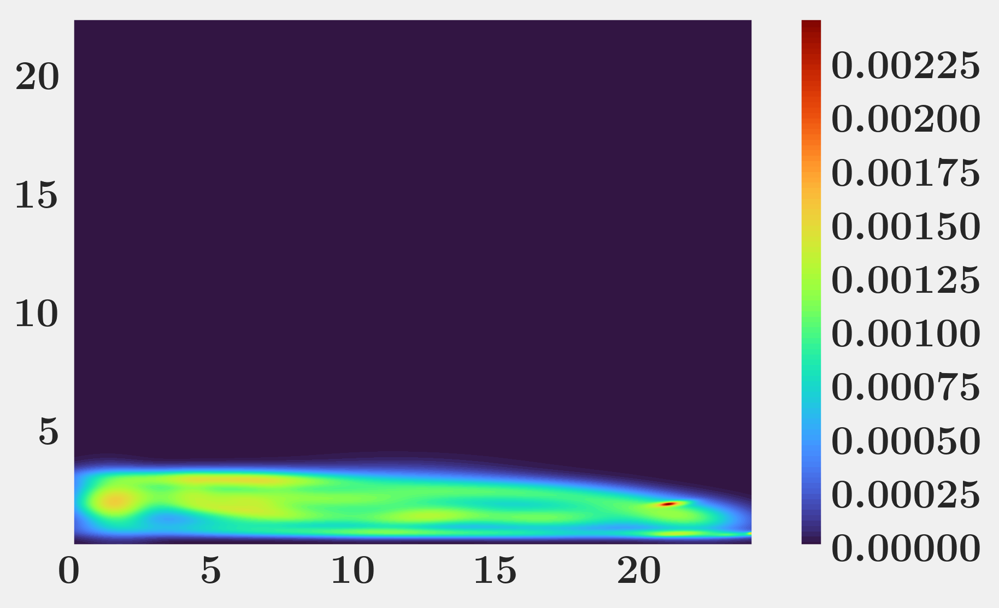

In [341]:
GMM_beta = np.zeros_like(new_beta)
for ind,(n_beta) in enumerate(betas):
    beta_max = max_vals[ind] - min_vals[ind]
    print(beta_max)
    cur_beta = beta_max*proc_utils.normalize(n_beta.copy())
    GMM_beta+=cur_beta

fig, ax = plt.subplots(nrows=1, ncols=1)
img = ax.contourf(x, y, GMM_beta, 100, cmap="turbo")
plt.colorbar(img, ax=ax)
plt.show()

In [ ]:
# Creating new xr dataset
#new_grid_seconds = X[0,:]*scale_time
#new_times = [day_date+timedelta(seconds=sec) for sec in new_grid_seconds]
max_height = 15
GMM_beta_da = xr.zeros_like(daily_beta_chan)
GMM_beta_da.beta.loc[dict(Wavelength=wavelength)]= GMM_beta #new_beta.reshape((len(y), len(new_times)))
#new_beta_da['beta'] = xr.apply_ufunc(lambda x, r: r*proc_utils.normalize(x), new_beta_da.beta, beta_max, keep_attrs=True)
GMM_beta_da['date'] = day_date
source_function = 'BayesianGaussianMixture'
GMM_beta_da.beta.attrs = {'long_name': r'$\beta _{\rm GMM}$',
                           'units': r'$\rm \frac{1}{km \cdot sr}$',
                           'info': f"2D GMM {source_function} representation of aerosol backscatter estimated by PollyNet Processing Chain, Tropos. Timescale {round(time_scale)} max height{max_height}km"}

# Plotting the results
:plot_daily_profile_for_publish(GMM_beta_da.beta,height_slice=slice(0,max_height),figsize=(12,5),save_fig=SAVE_FIG)


# Saving to nc file
GMM_beta_da.beta.attrs = {'long_name': r'$\beta $',
                           'units': r'$\rm \frac{1}{km \cdot sr}$',
                           'info': f"2D KDE representation of aerosol backscatter estimated by PollyNet Processing Chain, Tropos."
                                   f" Timescale:{time_scale} "
                                   f"method: {source_function}"}

nc_fname = f"Backscatter 2D GMM{source_function} {day_date.strftime('%Y_%m_%d')} timescale {round(time_scale)} n_levels{len(levels)}.nc"
nc_path = os.path.join(os.path.abspath(os.curdir),'figures',nc_fname)


Repeating GMM_1: converged = True, weights of covariances: [0.05 0.25 0.15 0.43 0.11]
means : [[11.86019918  6.54037985]
 [ 5.87888897  2.00167784]
 [20.38254692  1.28011933]
 [13.05729996  1.89746642]
 [ 1.67712281  1.95685752]], covariances: [[40.49376267  4.0809557 ]
 [ 5.93242648  0.77229322]
 [ 4.86764104  0.27501846]
 [15.02263211  0.70478445]
 [ 1.20410269  0.74911775]]


C:\Users\addalin\AppData\Local\Temp\ipykernel_9544\4129534712.py:21: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar(img, cax=cax, orientation='vertical')


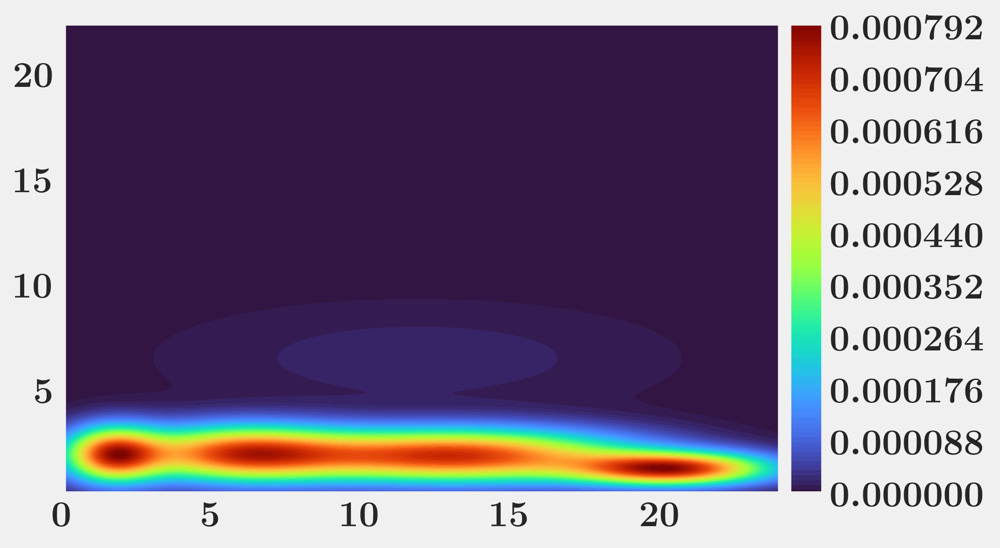

0.0008 0.0 0.0008


In [354]:
cur_gmm = BayesianGaussianMixture(n_components=5,covariance_type="diag",
                              tol=0.00001,reg_covar= 1e-8 ,max_iter=600, # increase max_iter
                              n_init=20, mean_prior=(-X[0,:].mean(),-0.2)) # "tied", "diag", "full"
ind = 0
# = gmms[ind]
samples = samples_levels[ind]
cur_gmm.fit(samples.T)
fig, ax = plt.subplots(nrows=1, ncols=1)
z = cur_gmm.score_samples(XY.T) # Note that this method returns log-likelihood
print(f"Repeating GMM_{ind+1}: converged = {cur_gmm.converged_}, weights of covariances: {np.round(cur_gmm.weights_,2)}")
print(f"means : {cur_gmm.means_}, covariances: {cur_gmm.covariances_}")
# print gmm.means,  and gmm.converged_ , gmm.covariances_   (save these calculations to check if one need to re-run)
z = np.exp(z) # e^x to get likelihood values
z = z.reshape(X.shape)
#beta_max = weights.max().item()-weights.min().item()
beta_max = max_vals[ind] - min_vals[ind]
cur_beta = beta_max*proc_utils.normalize(z.copy())
img = ax.contourf(x, y, cur_beta, 100, cmap="turbo")
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
plt.colorbar(img, cax=cax, orientation='vertical')
plt.show()

print(max_vals[ind], min_vals[ind], beta_max)

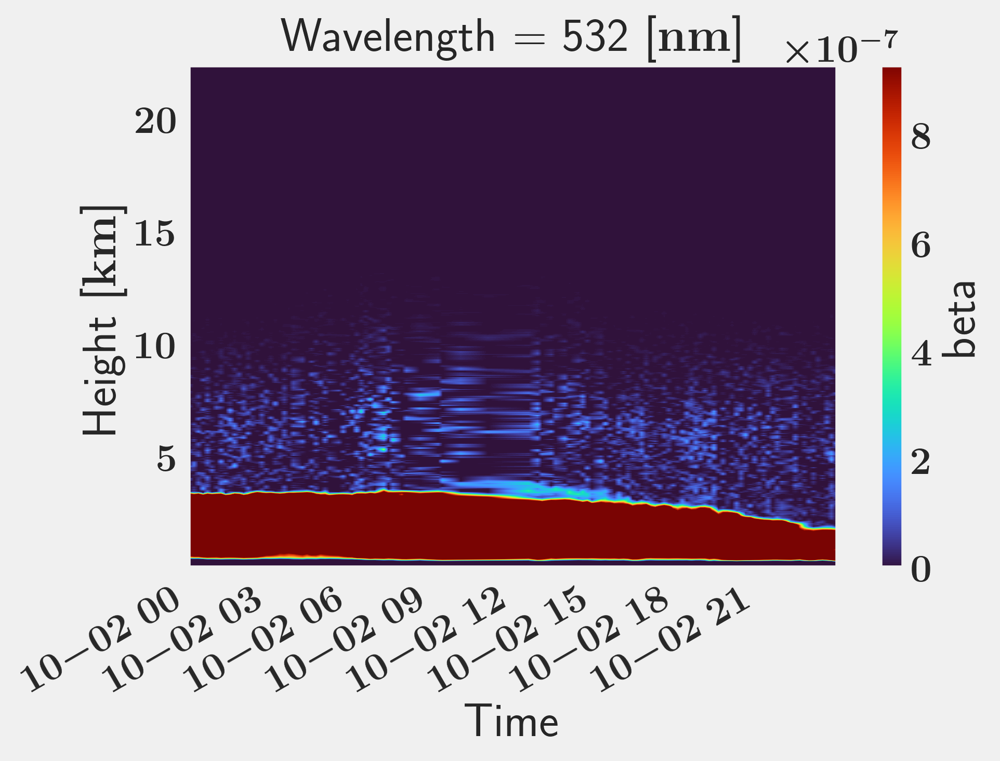

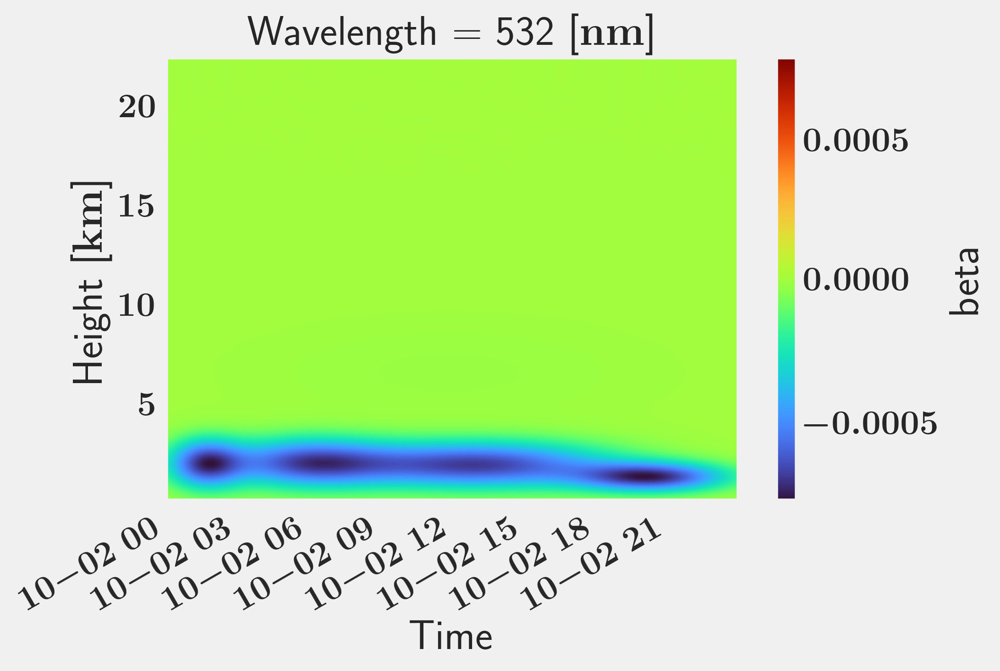

In [355]:
weights = weights_levels[ind]
weights.plot(cmap='turbo')
plt.show()

weights_dif = xr.apply_ufunc(lambda x,y: x-y, weights, cur_beta, keep_attrs=True)
weights_dif.plot(cmap='turbo')
plt.show()

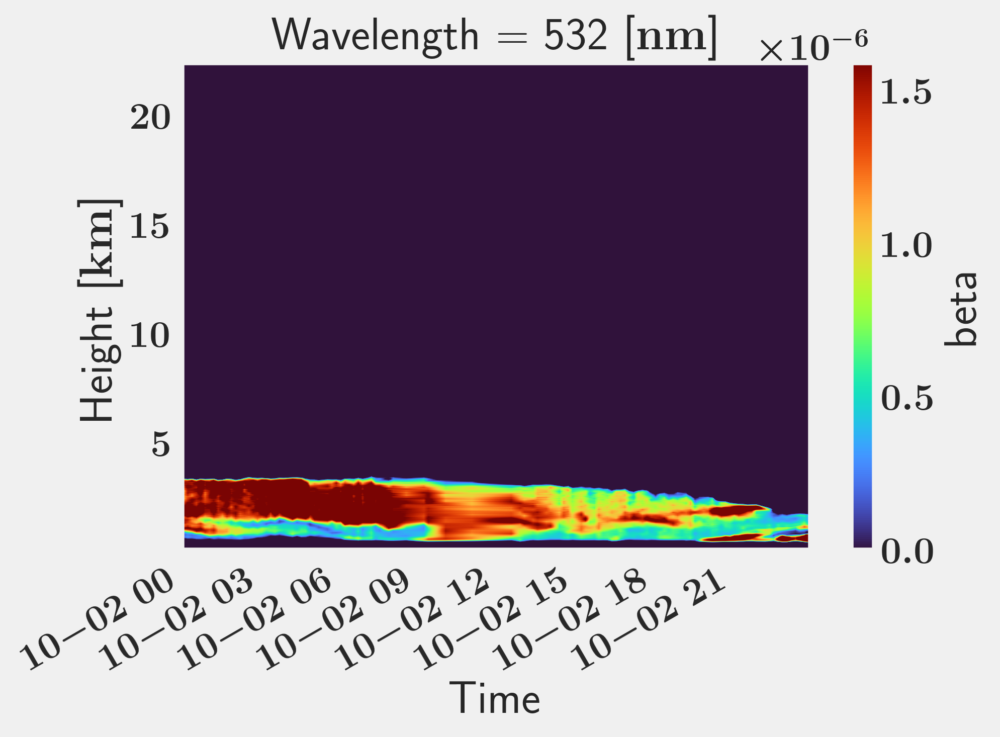

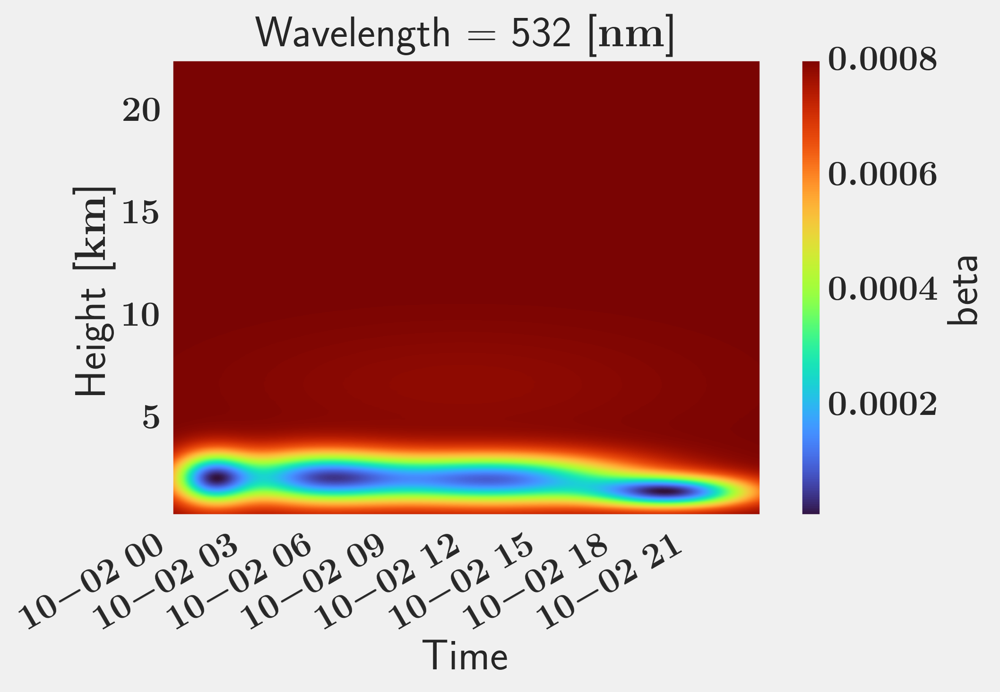

In [353]:
weights_1 = weights_levels[ind+1]
weights_1.plot(cmap='turbo')
plt.show()
#beta_max = max_vals[ind+1] - min_vals[ind]
weights_add = xr.apply_ufunc(lambda x,y: x+y, weights_1, weights_dif, keep_attrs=True) +min_vals[ind+1]
weights_add.plot(cmap='turbo')
plt.show()

### Search for number of clusters

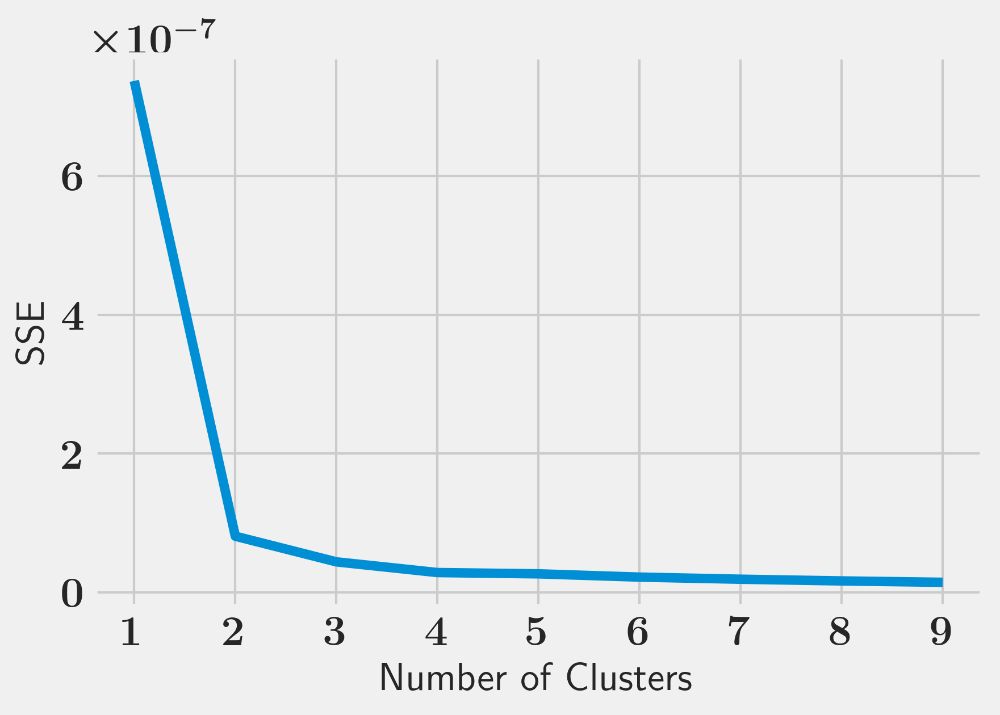

2

In [263]:



kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}




# A list holds the SSE values for each k
sse = []
k_options = range(1, 10)
data = daily_beta_chan.sel(Wavelength = 532, Height=slice(0,15) ).interp_beta.clip(min=gs.eps, max=0.006).values
for k in k_options:
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit( weights_levels[0][0,:,:])
    sse.append(kmeans.inertia_)

plt.style.use("fivethirtyeight")
plt.plot(k_options, sse)
plt.xticks(k_options)
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()


kl = KneeLocator(
    k_options, sse, curve="convex", direction="decreasing"
)

kl.elbow

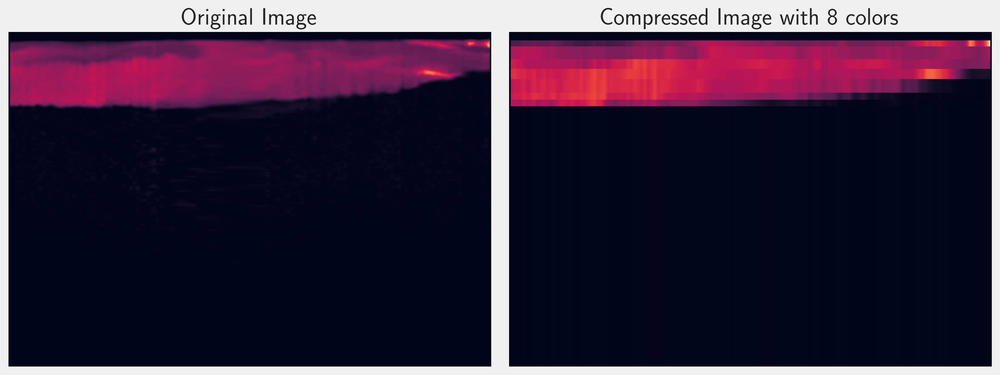

In [182]:
# Set the image
IMG = data #daily_beta_chan.sel(Wavelength = 532, Height=slice(0,15) ).interp_beta.values #weights[0,:,:]
img_size = IMG.shape
# Run the Kmeans algorithm
nc = 8
km = KMeans(n_clusters=nc)
km.fit(IMG)

# Use the centroids to compress the image
IMG_compressed = km.cluster_centers_[km.labels_]
#IMG_compressed = np.clip(IMG_compressed.astype('uint8'), 0, 255)

# Reshape X_recovered to have the same dimension as the original image 128 * 128 * 3
IMG_compressed = IMG_compressed.reshape(img_size[0], img_size[1])

# Plot the original and the compressed image next to each other
fig, ax = plt.subplots(1, 2, figsize = (12, 8))
ax[0].imshow(IMG)
ax[0].set_title('Original Image')
ax[1].imshow(IMG_compressed)
ax[1].set_title(f'Compressed Image with {nc} colors')
for ax in fig.axes:
    ax.axis('off')
plt.tight_layout();

C:\Users\addalin\.conda\envs\lidar_local_new\lib\site-packages\sklearn\mixture\_base.py:277: ConvergenceWarning: Initialization 10 did not converge. Try different init parameters, or increase max_iter, tol or check for degenerate data.
  warnings.warn(


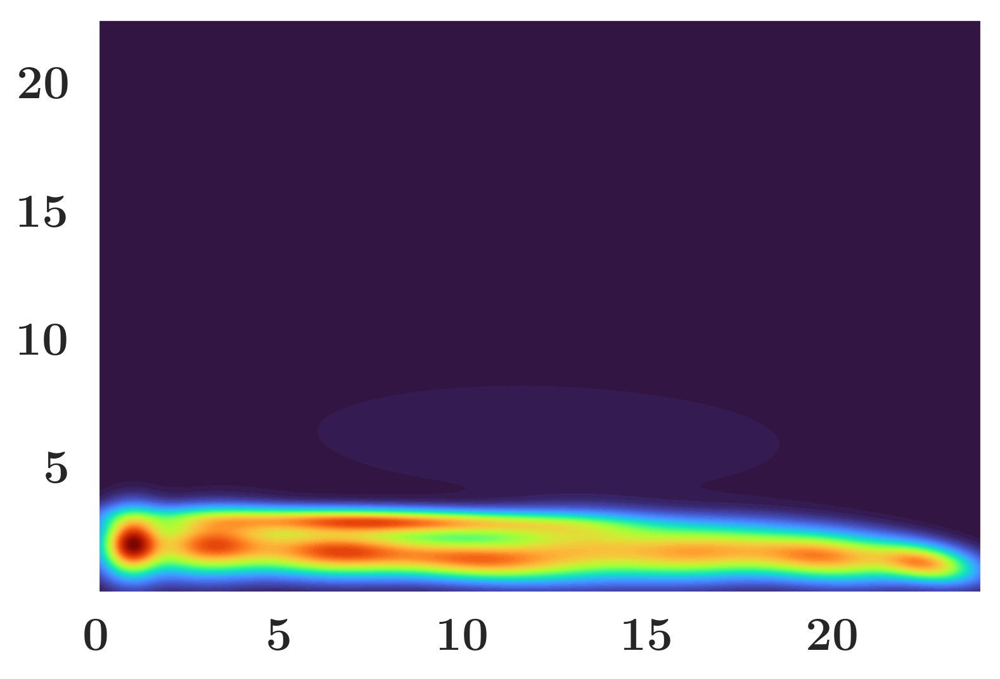

In [147]:
gmm = BayesianGaussianMixture(n_components=10,covariance_type="full",
                              tol=0.0001,reg_covar= 1e-7,max_iter=200,
                              n_init=10, mean_prior=(X[0,:].mean(),0.2)) # "tied", "diag", "full"
gmm.fit(XY_samples.T)
z = gmm.score_samples(XY.T) # Note that this method returns log-likehood
z = np.exp(z) # e^x to get likehood values
z = z.reshape(X.shape)


new_beta = beta_max*proc_utils.normalize(z.copy())

plt.contourf(x, y, new_beta, 100, cmap="turbo")

plt.show()

In [148]:
np.round(gmm.weights_,2), gmm.covariances_

(array([0.14, 0.11, 0.06, 0.11, 0.04, 0.12, 0.15, 0.11, 0.12, 0.04]),
 array([[[ 2.56978405e+00, -6.75051781e-02],
         [-6.75051781e-02,  3.95172724e-01]],
 
        [[ 2.23133816e+00, -1.62163540e-01],
         [-1.62163540e-01,  3.86870105e-01]],
 
        [[ 2.76978594e-01,  5.04023993e-03],
         [ 5.04023993e-03,  6.30882614e-01]],
 
        [[ 2.56100739e+00, -2.03500527e-02],
         [-2.03500527e-02,  5.42136957e-01]],
 
        [[ 8.01387811e-01, -1.50630441e-01],
         [-1.50630441e-01,  2.42616711e-01]],
 
        [[ 1.35908162e+00,  4.91399543e-02],
         [ 4.91399543e-02,  5.65817830e-01]],
 
        [[ 1.34802586e+01, -3.12286274e-01],
         [-3.12286274e-01,  1.10056301e-01]],
 
        [[ 3.09202763e+00, -2.30400535e-01],
         [-2.30400535e-01,  3.04870216e-01]],
 
        [[ 2.63892566e+00,  1.11988387e-01],
         [ 1.11988387e-01,  4.68398072e-01]],
 
        [[ 4.00059246e+01, -1.62927376e+00],
         [-1.62927376e+00,  4.13918737e+00]]]))

C:\Users\addalin\AppData\Local\Temp\ipykernel_500\3131755075.py:11: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


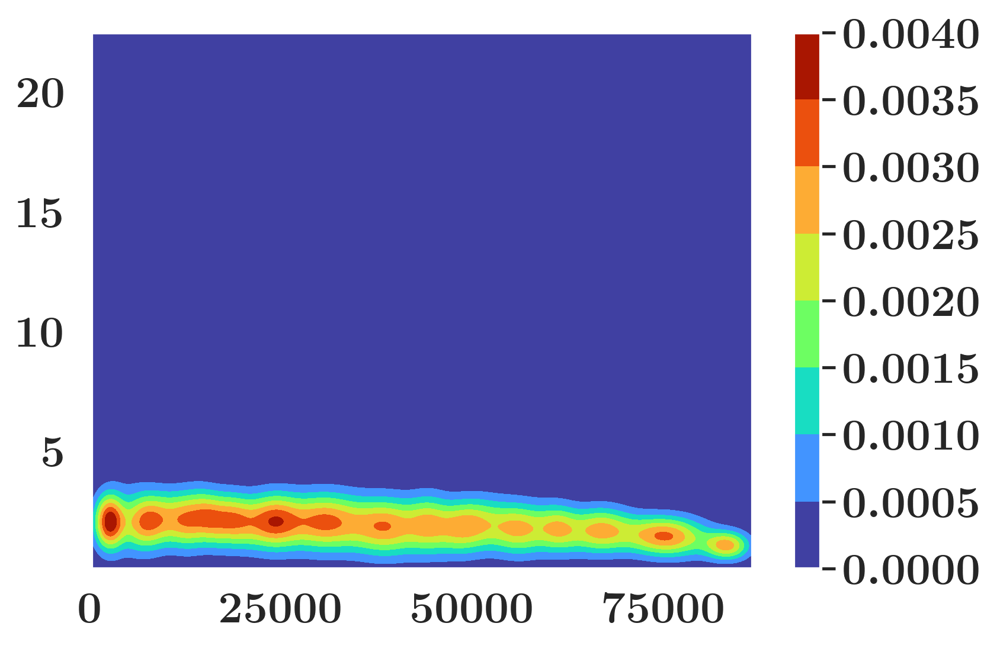

In [206]:
gmm = GaussianMixture(n_components=21,covariance_type="full", tol=0.001)
gmm.fit(XY_samples.T)
z = gmm.score_samples(XY.T) # Note that this method returns log-likehood
z = np.exp(z) # e^x to get likehood values
z = z.reshape(X.shape)

beta_max =   interp_beta.max().item() #daily_beta_chan.sel(Time=slice(day_date, day_date+timedelta(hours=21)),Height=slice(0,max_height)).beta.max().item() # 2.8e-3
new_beta = beta_max*proc_utils.normalize(z.copy())

plt.contourf(x, y, new_beta,50, cmap="turbo")
plt.colorbar()
plt.show()

## Testing my KDE

In [9]:
month_folder = utils.get_month_folder_name(station.lidar_dataset, day_date)
file_name = xr_utils.get_prep_dataset_file_name(station, day_date, data_source='lidar', file_type='all')
raw_daily_path = glob.glob(os.path.join(month_folder, file_name))[0]
raw_daily_path #raw_daily = xr_utils.load_dataset(raw_daily_path)
#raw_daitype(raw_daily_path)
raw_daily_ds = xr_utils.load_dataset(raw_daily_path)

C:\Users\addalin\AppData\Local\Temp\ipykernel_18640\6617760.py:72: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, .87, 1])


Saving fig to figures\Raw Range Corrected Lidar Signal - 2017-10-02


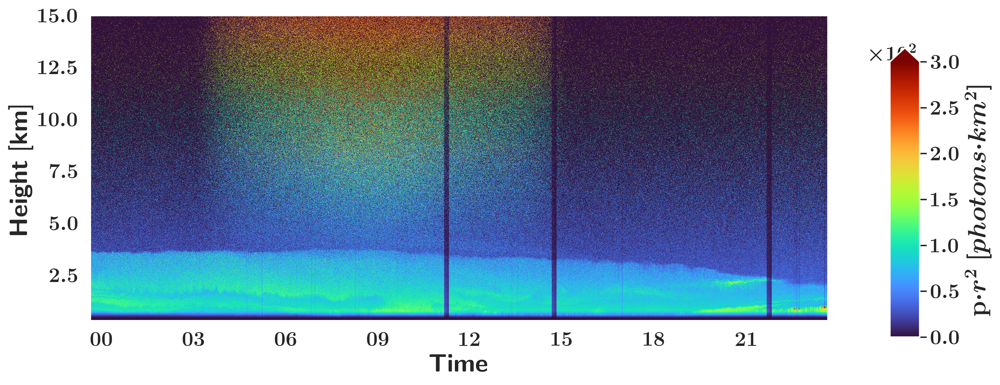

'figures\\Raw Range Corrected Lidar Signal - 2017-10-02'

In [42]:
:plot_daily_profile_for_publish(raw_daily_ds.range_corr.sel(Wavelength=532),height_slice=height_slice,figsize=(12,5),save_fig=SAVE_FIG, threshold=300)